# Signal, Image and Video: Detecting and Counting Blood Cells
Authors: Francesco Nesler, Francesco Di Bon

This notebook presents an automated image processing pipeline designed for the detection and enumeration of fundamental hematological components: Red Blood Cells (RBCs), White Blood Cells (WBCs), and Platelets.
This application is especially useful in hospitals' laboratories, enabling medical laboratory technicias to spot potentially problematic patients' conditions, such as:
- **Low RBC count (Anemia)**: May be caused by iron deficiency, internal bleeding, or bone marrow issues
- **High RBC count (Polycythemia)**: Might suggest dehydration or heart/lung diseases where the body is overcompensating for low oxygen levels
- **High WBC count**: Usually signals an infection or inflammation. However, extremely high counts can be a red flag for leukemia
- **Low WBC count**: Can indicate a weakened immune system, often due to viral infections, autoimmune disorders, or certain medications
- **High platelets count (Thrombocytosis)**: Can lead to dangerous blood clots, potentially causing strokes or heart attacks
- **Low platelets count (Thrombocytopenia)**: Puts a patient at risk for uncontrolled bleeding or easy bruising

Automating the analysis of microscopic blood images can drastically reduce the time required to perform such examinations.

## Technical Challenges

To ensure robust detection, the processing pipeline must overcome several constraints inherent to biomedical imaging, specifically:

- **Cell Overlapping (RBC Aggregation)**: Red Blood Cells frequently overlap or cluster together (rouleaux formation). In simple thresholding approaches, these clusters appear as a single large object rather than distinct entities, necessitating advanced segmentation techniques like the Watershed algorithm to separate touching cells.

- **Signal-to-Noise Ambiguity (Platelets)**: Platelets are significantly smaller than other cell types and possess irregular shapes. Due to their size, they are morphologically similar to background noise, dust, or staining artifacts, making the distinction between a valid platelet and image noise a critical challenge.

- **Variable Image Quality**: Biomedical slides often exhibit non-uniform illumination (vignetting) and soft, ill-defined cell boundaries. This lack of edge sharpness complicates the extraction of precise contours, requiring robust pre-processing steps such as contrast equalization (CLAHE) and Gaussian blurring to standardize the input data.

The workflow starts with the acquisition of a dataset containing the mentioned microscopic blood smear images along with bounding box annotations, which serve as the ground truth for the detection and localization of Red Blood Cells, White Blood Cells, and Platelets.

In [1]:
# Required to use YOLO
!pip install -q ultralytics

import os
import cv2
import glob
import shutil
import random
import yaml
import json
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
import warnings
import random
import xml.etree.ElementTree as ET
import pandas as pd

warnings.filterwarnings('ignore')
np.random.seed(42)

BASE_INPUT_DIR = '/kaggle/input/bccd-blood-cell-count-and-detection-dataset'

DIRS = {
    'train': {
        'img': os.path.join(BASE_INPUT_DIR, 'train', 'img'),
        'ann': os.path.join(BASE_INPUT_DIR, 'train', 'ann')
    },
    'val': {
        'img': os.path.join(BASE_INPUT_DIR, 'val', 'img'),
        'ann': os.path.join(BASE_INPUT_DIR, 'val', 'ann')
    },
    'test': {
        'img': os.path.join(BASE_INPUT_DIR, 'test', 'img'),
        'ann': os.path.join(BASE_INPUT_DIR, 'test', 'ann')
    }
}

print("Checking dataset paths...")
for split in ['train', 'val', 'test']:
    n_imgs = len(glob.glob(os.path.join(DIRS[split]['img'], '*.*')))
    n_anns = len(glob.glob(os.path.join(DIRS[split]['ann'], '*.json')))
    print(f"   - {split.upper()}: {n_imgs} images, {n_anns} json files")

WORK_DIR = '/kaggle/working/bccd_yolo'

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 35.6 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Checking dataset paths...
   - TRAIN: 205 images, 205 json files
   - VAL: 87 images, 87 json files
   - TEST: 72 images, 72 json files


# Helper Functions
Visualization utilities andhelper functions used to keep our code clean.

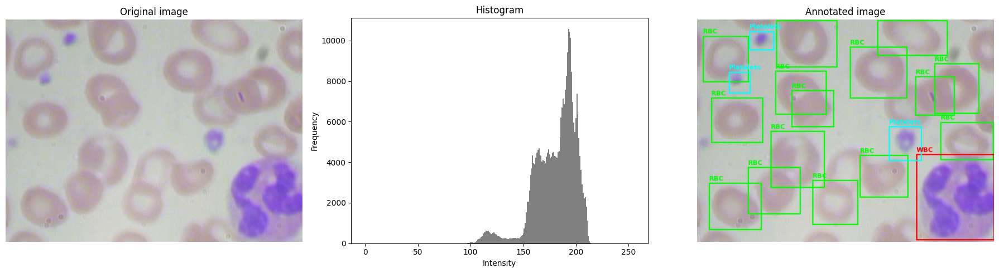

RBC: 15, WBC: 1


In [2]:
import matplotlib.patches as patches
import io

def get_image(image_path):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError("Image not found")

    return image

def get_histogram(image):
    if image.ndim == 3:
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray_image = image

    hist = cv2.calcHist([gray_image], [0], None, [256], [0, 256])
    return hist.flatten()

def get_annotations_path(image_path):
    base_dir = os.path.dirname(os.path.dirname(image_path)) # Go up to split folder
    filename = os.path.basename(image_path)
    
    # Path logic: image.jpeg -> image.jpeg.json
    annotation_path = os.path.join(base_dir, 'ann', filename + ".json")
    if not os.path.exists(annotation_path):
        raise FileNotFoundError(f"Annotation file not found at: {annotation_path}")
    return annotation_path

def get_annotations(annotations_path):
    """Load and return the JSON annotation data as a dictionary."""
    with open(annotations_path, 'r', encoding='utf-8') as f:
        data = json.load(f)
    return data

def get_annotated_image(image, annotations):
    """
    Returns a new image with annotations burned in.
    """
    fig, ax = plt.subplots(figsize=(image.shape[1]/100, image.shape[0]/100), dpi=100)
    
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

    for obj in annotations.get('objects', []):
        if obj['geometryType'] == 'rectangle':
            p1, p2 = obj['points']['exterior']
            x, y = p1[0], p1[1]
            w, h = p2[0] - p1[0], p2[1] - p1[1]
            
            label = obj['classTitle']
            
            if label == 'WBC': color = 'red'
            elif label == 'RBC': color = 'lime'
            elif label == 'Platelets': color = 'cyan' 
            else: color = 'yellow' 
            
            rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor=color, fill=False)
            ax.add_patch(rect)
            ax.text(x, y - 5, label, color=color, fontsize=10, fontweight='bold')

    # Convert plot to a numpy array
    io_buf = io.BytesIO()
    fig.savefig(io_buf, format='raw', dpi=100)
    io_buf.seek(0)
    img_arr = np.frombuffer(io_buf.getvalue(), dtype=np.uint8)
    img_arr = img_arr.reshape(int(fig.bbox.bounds[3]), int(fig.bbox.bounds[2]), -1)
    
    # Drop Alpha channel if present
    if img_arr.shape[2] == 4:
        img_arr = img_arr[:, :, :3]

    plt.close(fig)

    return cv2.cvtColor(img_arr, cv2.COLOR_RGB2BGR)

def markers_to_detections(markers, wbc_mask, platelet_mask, padding=10):
    """
    Converts segmentation markers into bounding boxes with optional padding.
    """
    detections = []
    h_img, w_img = markers.shape[:2] # Image dimensions for boundary checks

    # Helper function to safely expand a box
    def get_padded_box(x, y, w, h, pad, max_w, max_h):
        new_x = max(0, x - pad)
        new_y = max(0, y - pad)
        
        # Increase width and height by 2*pad (to expand right and down too)
        new_w = min(max_w - new_x, w + (2 * pad))
        new_h = min(max_h - new_y, h + (2 * pad))
        
        return [int(new_x), int(new_y), int(new_w), int(new_h)]

    # RBC Detections (from Markers)
    labels = np.unique(markers)
    for label in labels:
        if label <= 1: continue  # Skip background (1) and unknown (0)
        
        # Create a temporary mask for this specific cell
        cell_mask = np.zeros(markers.shape, dtype="uint8")
        cell_mask[markers == label] = 255
        
        # Find bounding rect
        cnts, _ = cv2.findContours(cell_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if cnts:
            x, y, w, h = cv2.boundingRect(cnts[0])
            
            padded_box = get_padded_box(x, y, w, h, padding, w_img, h_img)
            
            detections.append({
                'classTitle': 'RBC',
                'box': padded_box
            })

    # WBC Detections (from Mask)
    cnts_wbc, _ = cv2.findContours(wbc_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for c in cnts_wbc:
        x, y, w, h = cv2.boundingRect(c)
        # WBCs usually need more padding
        wbc_pad = padding + 10 
        padded_box = get_padded_box(x, y, w, h, wbc_pad, w_img, h_img)
        
        detections.append({
            'classTitle': 'WBC',
            'box': padded_box
        })

    # Platelet Detections (from Mask)
    cnts_plat, _ = cv2.findContours(platelet_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for c in cnts_plat:
        x, y, w, h = cv2.boundingRect(c)
        # Platelets are small, regular padding is usually fine
        padded_box = get_padded_box(x, y, w, h, padding, w_img, h_img)
        
        detections.append({
            'classTitle': 'Platelets',
            'box': padded_box
        })

    return detections

def visualize_detections(image, detections):
    fig, ax = plt.subplots(figsize=(image.shape[1]/100, image.shape[0]/100), dpi=100)
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

    for obj in detections:
        label = obj['classTitle']
        x, y, w, h = obj['box']
        
        if label == 'WBC': color = 'red'
        elif label == 'RBC': color = 'lime'
        else: color = 'cyan' # Platelets
        
        rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor=color, fill=False)
        ax.add_patch(rect)
        ax.text(x, y - 5, label, color=color, fontsize=10, fontweight='bold')

    io_buf = io.BytesIO()
    fig.savefig(io_buf, format='raw', dpi=100)
    io_buf.seek(0)
    img_arr = np.frombuffer(io_buf.getvalue(), dtype=np.uint8)
    img_arr = img_arr.reshape(int(fig.bbox.bounds[3]), int(fig.bbox.bounds[2]), -1)
    if img_arr.shape[2] == 4: img_arr = img_arr[:, :, :3]
    plt.close(fig)
    return cv2.cvtColor(img_arr, cv2.COLOR_RGB2BGR)
    
def plot_data(data, titles=None):
    if not isinstance(data, list):
        data = [data]
    
    if titles is None or len(titles) != len(data):
        titles = [None] * len(data)
        
    num_items = len(data)
    fig, axes = plt.subplots(1, num_items, figsize=(6 * num_items, 5))
    
    if num_items == 1:
        axes = [axes]

    for ax, item, title in zip(axes, data, titles):
        
        if item.ndim == 3:
            item_rgb = cv2.cvtColor(item, cv2.COLOR_BGR2RGB)
            ax.imshow(item_rgb)
            ax.axis('off')
            default_title = "Image"
            
        elif item.ndim == 2:
            ax.imshow(item, cmap='gray')
            ax.axis('off')
            default_title = "Mask/Grayscale"
            
        elif item.ndim == 1:
            ax.bar(range(len(item)), item, width=1, color='gray', edgecolor='none')
            ax.set_xlabel("Intensity")
            ax.set_ylabel("Frequency")
            default_title = "Histogram"

        if title:
            ax.set_title(title)
        else:
            ax.set_title(default_title)

    plt.tight_layout()
    plt.show()
    
def get_ground_truth(annotations):

    try:
        counts = {'WBC': 0, 'RBC': 0, 'Platelets': 0}
        if 'objects' in annotations:
            for obj in annotations['objects']:
                label = obj.get('classTitle')
                if label in counts:
                    counts[label] += 1
        
        return counts['WBC'], counts['RBC']
    except Exception as e:
        raise ValueError(f"Failed to parse ground truth data: {e}")

def compute_iou(boxA, boxB):
    # box format: [x1, y1, x2, y2]
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    
    interArea = max(0, xB - xA) * max(0, yB - yA)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    
    iou = interArea / float(boxAArea + boxBArea - interArea + 1e-6)
    return iou

def compute_image_iou(gt_boxes, pred_boxes):
    if len(gt_boxes) == 0:
        return 1.0 if len(pred_boxes) == 0 else 0.0
    if len(pred_boxes) == 0:
        return 0.0

    ious = []
    for gt_box in gt_boxes:
        best_iou = 0
        for pred_box in pred_boxes:
            iou = compute_iou(gt_box, pred_box)
            if iou > best_iou:
                best_iou = iou
        ious.append(best_iou)
    
    return np.mean(ious)

# sample_image_path = glob.glob(os.path.join(DIRS['test']['img'], '*.jpeg'))[0]
sample_image_path = '/kaggle/input/bccd-blood-cell-count-and-detection-dataset/test/img/BloodImage_00407.jpeg'
sample_image = get_image(sample_image_path)
sample_histogram = get_histogram(sample_image)
sample_annotations = get_annotations(get_annotations_path(sample_image_path))
sample_annotated_image = get_annotated_image(sample_image, sample_annotations)
plot_data([sample_image, sample_histogram, sample_annotated_image], titles=["Original image", "Histogram", "Annotated image"])
sample_wbc, sample_rbc = get_ground_truth(sample_annotations)
print(f"RBC: {sample_rbc}, WBC: {sample_wbc}")

# Classical Image Processing Pipeline

This section implements a pipeline leveraging classical image processing techniques, mainly using `opencv` and `numpy`.

**Overview:**
1. **WBCs:** The image undergoes contrast enhancement, followed by color masking to isolate the regions of interest. This facilitates the specific detection and enumeration of White Blood Cells.
1. **Platelets:** Preprocessing follows a similar approach to the WBC pipeline. The resulting components are analyzed and filtered based on size and shape constraints to exclude non-platelet artifacts.
1. **RBCs:** The Green channel is enhanced using CLAHE and Gaussian blurring. After distinguishing the foreground from the background, the Watershed algorithm is applied to segment individual Red Blood Cells.

## White Blood Cells

### Preprocessing
To optimize the detection of White Blood Cells (WBCs), the input images undergo a preprocessing stage. This phase primarily utilizes CLAHE (Contrast Limited Adaptive Histogram Equalization) and Gaussian blurring to suppress noise.

To enhance local contrast, CLAHE is applied specifically to the Lightness (L) channel of the [LAB](https://opencv.org/blog/color-spaces-in-opencv/#h-lab-lightness-a-channel-b-channel-color-space) representation).
The processed image demonstrates increased contrast and a broader histogram distribution, confirming the effectiveness of the equalization.

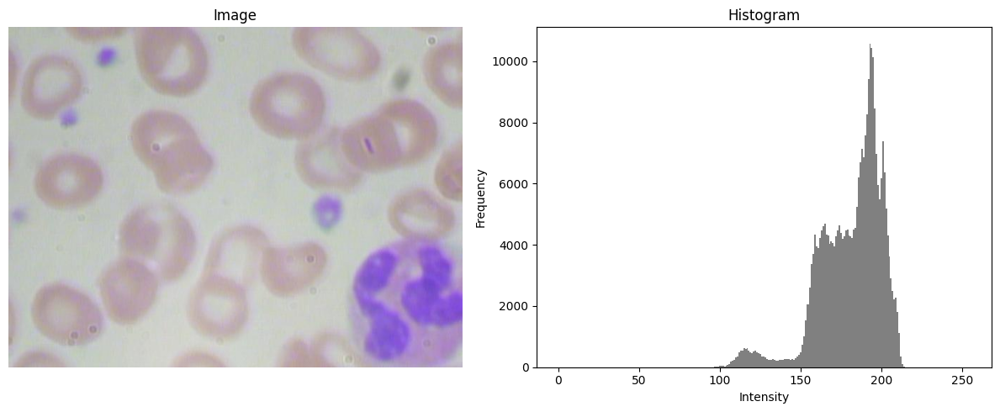

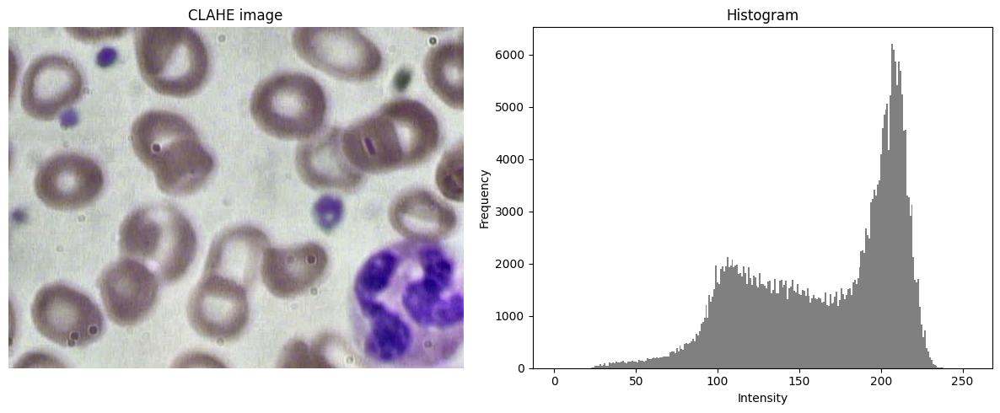

In [3]:
def apply_CLAHE(image):
    """
    Applies Contrast Limited Adaptive Histogram Equalization (CLAHE) 
    to the Lightness (L) channel of an image.
    """
    
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    l_clahe = clahe.apply(l)
    lab_merged = cv2.merge((l_clahe, a, b))
    clahe_image = cv2.cvtColor(lab_merged, cv2.COLOR_LAB2BGR)
    
    return clahe_image

sample_clahe_image = apply_CLAHE(sample_image)
sample_histogram = get_histogram(sample_image)
sample_clahe_histogram = get_histogram(sample_clahe_image)

plot_data([sample_image, sample_histogram], titles=["Image", "Histogram"])
plot_data([sample_clahe_image, sample_clahe_histogram], titles=["CLAHE image", "Histogram"])

Then, Gaussian blur is used to smoothen out the histogram of the processed image, allowing for better detection later on.

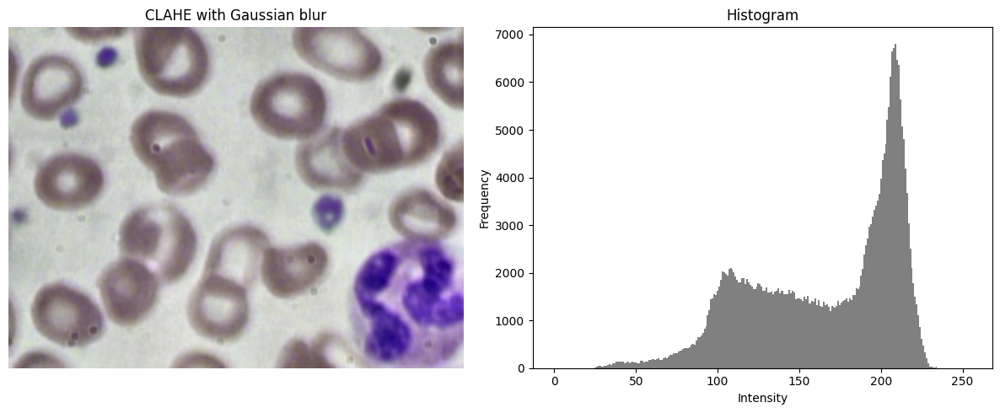

In [4]:
def apply_gaussian_blur(image, kernel_size=(7, 7)):
   return cv2.GaussianBlur(image, kernel_size, 0)

sample_blurred_image = apply_gaussian_blur(sample_clahe_image)
sample_merged_histogram = get_histogram(sample_blurred_image)
sample_clahe_histogram = get_histogram(sample_clahe_image)
plot_data([sample_blurred_image, sample_merged_histogram], titles=["CLAHE with Gaussian blur", "Histogram"])

### Detection
Now that the preprocessing has been applied to the image, the pipeline proceeds to the segmentation and enumeration of White Blood Cells (WBCs).

The [HSV](https://opencv.org/blog/color-spaces-in-opencv/#h-hsv-hue-saturation-value-color-space) is utilized to isolate White Blood Cells (WBCs) by exploiting their distinct purple coloration compared to other cellular components. 
A binary mask is generated using specific color thresholds (obtained using [this utility Python script](https://github.com/di-bon/hsv_picker)) to effectively filter out all the colors that are not purple.

Visualization Note: In the debug plots below, the "HSV Image" is rendered by passing the raw HSV data directly to the plotting function, which expects RGB input. While this results in a false-color representation (where Hue is interpreted as Red, Saturation as Green, Value as Blue), the underlying image data remains identical. This visualization serves only to confirm the successful transformation of the pixel data into the HSV coordinate system. Also, by using this representation we can easily see which regions the mask is extracting form the image.

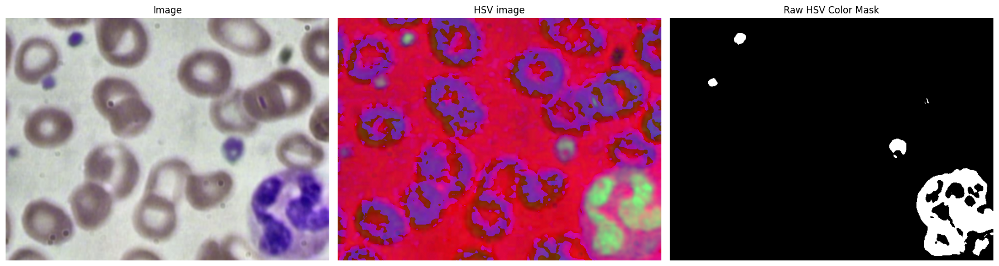

In [5]:
def get_hsv_mask(hsv_image, lower_thresh, upper_thresh, debug=False):
    """
    Creates a binary mask based on HSV color thresholds.
    """
    color_mask = cv2.inRange(hsv_image, lower_thresh, upper_thresh)

    if debug:
        bgr_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)
        plot_data([bgr_image, hsv_image, color_mask], titles=["Image", "HSV image","Raw HSV Color Mask"])

    return color_mask

sample_hsv_image = cv2.cvtColor(sample_blurred_image, cv2.COLOR_BGR2HSV)

sample_lower_purple = np.array([79, 77, 109])
sample_upper_purple = np.array([151, 212, 212])

sample_color_mask = get_hsv_mask(sample_hsv_image, sample_lower_purple, sample_upper_purple, debug=True)

Once the binary mask is generated, some [morphological operations](https://docs.opencv.org/4.x/d9/d61/tutorial_py_morphological_ops.html) are applied to refine it, reducing noise and ensuring structural consistency.

With the opening step, noise is removed by first applying an erosion step and then a dilation step. This filters out all the small regions (likely noise) of the mask.\
With the closing step, the opposite operation is performed, i.e. a dilation step folowed by an erosion one. This allows to fill the holes of the mask.

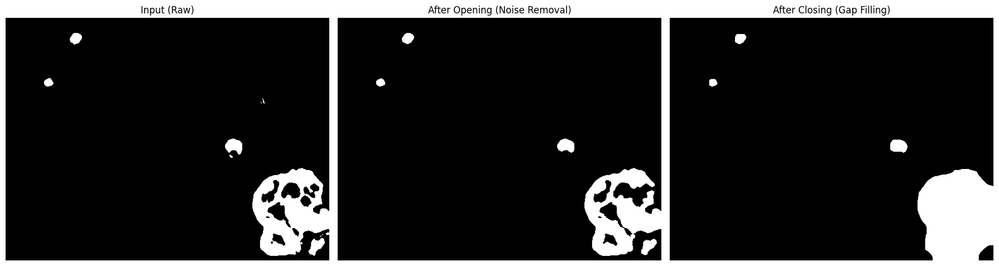

In [6]:
def clean_wbc_morphology(mask, debug=False):
    """
    Applies morphological operations (Open + Close) to clean the WBC mask.
    WBCs need strong 'Closing' to fill gaps in the nucleus.
    """

    kernel_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    mask_open = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel_open, iterations=2)

    kernel_close = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (20, 20))
    mask_cleaned = cv2.morphologyEx(mask_open, cv2.MORPH_CLOSE, kernel_close, iterations=2)
    
    if debug:
        plot_data(
            [mask, mask_open, mask_cleaned], 
            titles=["Input (Raw)", "After Opening (Noise Removal)", "After Closing (Gap Filling)"]
        )

    return mask_cleaned

sample_wbc_morph = clean_wbc_morphology(sample_color_mask, debug=True)

Finally, domain knowledge regarding cell size is utilized to refine the detection results. Connected components within the mask that fall below a specific area threshold are identified as noise and discarded, ensuring that only valid White Blood Cell candidates remain.

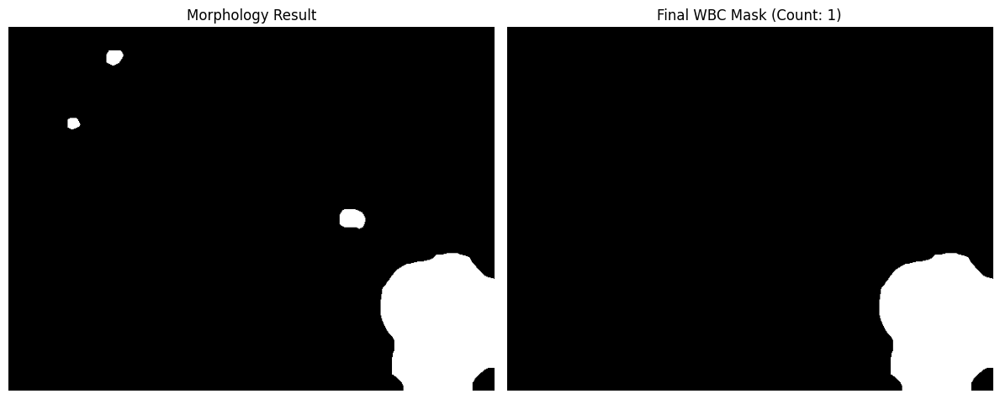

WBCs Detected: 1


In [7]:
def filter_wbc_by_size(mask, min_area=1500, debug=False):
    """
    Filters connected components based on area. 
    Keeps only large objects (WBCs).
    """
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask, connectivity=8)

    final_mask = np.zeros_like(mask)
    count = 0

    for i in range(1, num_labels):
        area = stats[i, cv2.CC_STAT_AREA]
        
        if area > min_area:
            final_mask[labels == i] = 255
            count += 1
            
    if debug:
        plot_data([mask, final_mask], titles=["Morphology Result", f"Final WBC Mask (Count: {count})"])

    return final_mask, count

sample_final_wbc_mask, sample_wbc_count = filter_wbc_by_size(sample_wbc_morph, min_area=1500, debug=True)
print(f"WBCs Detected: {sample_wbc_count}")

The processing steps described above are consolidated into a single function that detect and count the WBCs. 

WBC count: 1


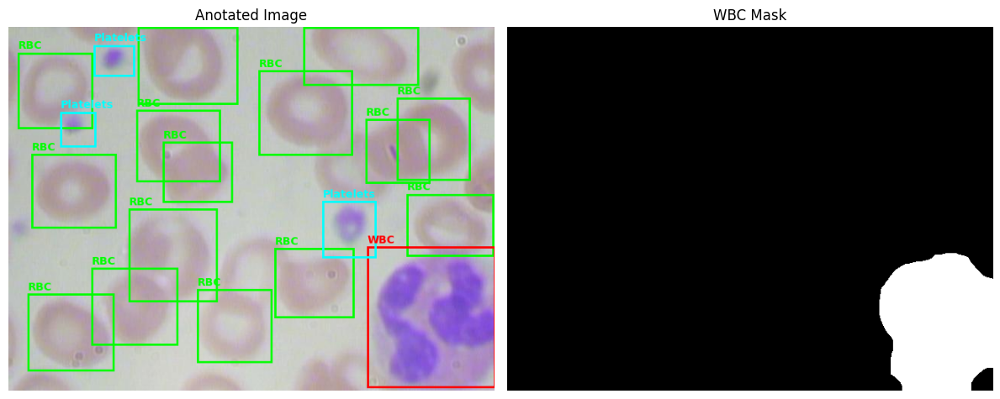

In [8]:
def get_wbc_mask(hsv_image, lower_thresh, upper_thresh, debug=False):
    raw_mask = get_hsv_mask(hsv_image, lower_thresh, upper_thresh, debug=debug)
    
    morph_mask = clean_wbc_morphology(raw_mask, debug=debug)
    
    final_mask, count = filter_wbc_by_size(morph_mask, min_area=1500, debug=debug)
    
    return final_mask, count

sample_hsv_image = cv2.cvtColor(sample_blurred_image, cv2.COLOR_BGR2HSV)

sample_lower_purple = np.array([79, 77, 109])
sample_upper_purple = np.array([151, 212, 212])

sample_wbc_mask, sample_wbc_count = get_wbc_mask(sample_hsv_image, sample_lower_purple, sample_upper_purple, debug=False)

print(f'WBC count: {sample_wbc_count}')
titles = ["Anotated Image", "WBC Mask"]
plot_data([sample_annotated_image, sample_wbc_mask], titles=titles)


## Platelets

To generate the initial binary mask for platelets, the segmentation function previously employed for White Blood Cells is utilized. This can be done as the platelets are the only other blood cell that are somewhat similar to WBCs (colorwise speaking).

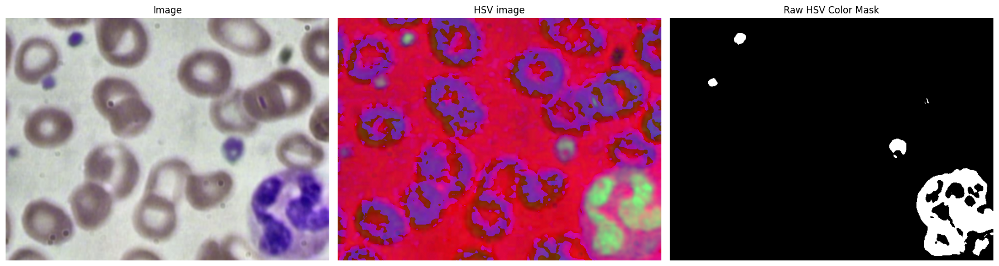

In [9]:
sample_color_mask = get_hsv_mask(sample_hsv_image, sample_lower_purple, sample_upper_purple, debug=True)

To isolate the platelets, the White Blood Cell (WBC) regions must be removed from the global segmentation mask.\
Prior to subtraction, the WBC mask is dilated to ensure that the entire cell structure, including the purple cytoplasm surrounding the nucleus, is fully covered. Subsequently, the bitwise AND operation is computed between the full segmentation mask and the inverted dilated WBC mask.\
The resulting output contains only the smaller connected components, effectively retaining potential platelets while suppressing White Blood Cells.

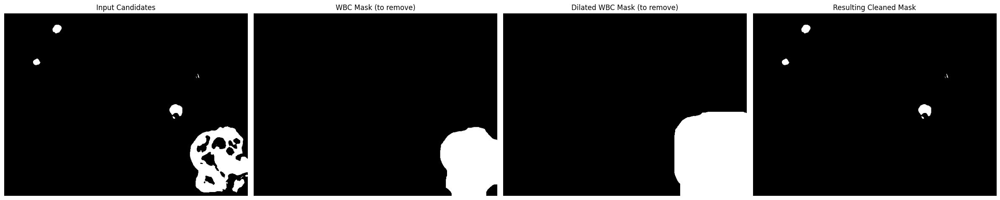

In [10]:
def platelets_remove_wbc_mask(candidate_mask, wbc_mask, debug=False):
    kernel = np.ones((9, 9), np.uint8)
    wbc_dilated = cv2.dilate(wbc_mask, kernel, iterations=10)
    
    wbc_inverted = cv2.bitwise_not(wbc_dilated)
    
    cleaned_mask = cv2.bitwise_and(candidate_mask, candidate_mask, mask=wbc_inverted)

    if debug:
        plot_data(
            [candidate_mask, wbc_mask,wbc_dilated, cleaned_mask], 
            titles=["Input Candidates", "WBC Mask (to remove)", "Dilated WBC Mask (to remove)", "Resulting Cleaned Mask"]
        )

    return cleaned_mask

sample_wbc_free_mask = platelets_remove_wbc_mask(sample_color_mask, sample_wbc_mask, debug=True)

To distinguish valid platelets from residual noise, a geometric filtration process is applied. Each candidate region is evaluated to ensure its area falls within a specific range and that its shape meets a minimum circularity threshold.

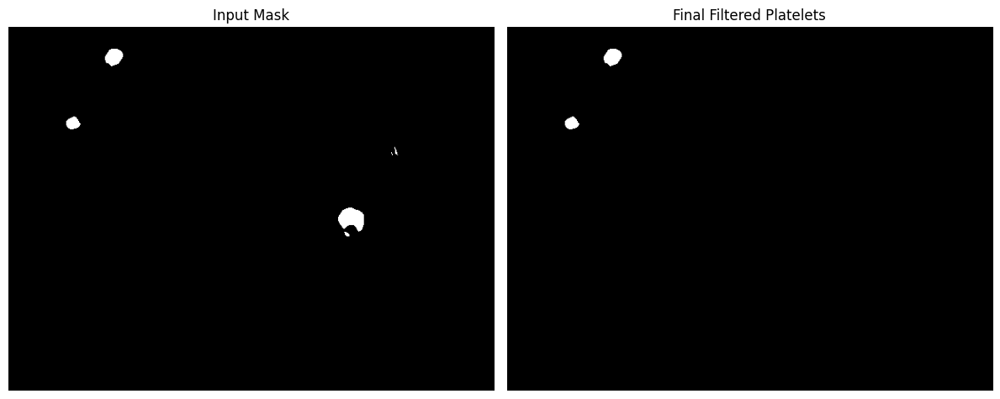

Platelets found: 2


In [11]:
def filter_platelets_by_shape(mask, min_area=50, max_area=3000, min_circularity=0.75, debug=False):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    cleaned_mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
    
    cnts, _ = cv2.findContours(cleaned_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    final_mask = np.zeros_like(cleaned_mask)
    count = 0
    
    for c in cnts:
        area = cv2.contourArea(c)
        
        if min_area < area < max_area:
            perimeter = cv2.arcLength(c, True)
            if perimeter == 0: continue
            
            # Filter by circularity
            circularity = (4 * np.pi * area) / (perimeter ** 2)
            
            if circularity > min_circularity:
                cv2.drawContours(final_mask, [c], -1, 255, -1)
                count += 1
                
    if debug:
        plot_data([mask, final_mask], titles=["Input Mask", "Final Filtered Platelets"])

    return final_mask, count

sample_final_platelets, sample_plat_count = filter_platelets_by_shape(sample_wbc_free_mask, debug=True)
print(f"Platelets found: {sample_plat_count}")

Here's a function that encapsulates the entire logic for the platelets

In [12]:
def get_platelet_mask(hsv_image, wbc_mask, lower_thresh, upper_thresh, return_intermediates=False):
    color_candidates = get_hsv_mask(hsv_image, lower_thresh, upper_thresh, debug=False)
    
    wbc_free_candidates = platelets_remove_wbc_mask(color_candidates, wbc_mask, debug=False)
    
    final_mask, count = filter_platelets_by_shape(wbc_free_candidates, debug=False)
    
    if return_intermediates:
        return final_mask, count, {
            'candidates': color_candidates,
            'wbc_free_candidates': wbc_free_candidates
        }
    
    return final_mask, count

## Red Blood Cells

### Preprocessing
For RBCs, a distinct preprocessing approach is adopted. The process resumes from the original BGR image.
Contrast enhancement (CLAHE) is still applied, but specifically to the Green (G) channel of the BGR color space. Since red objects appear darkest in the green spectral band, this channel provides the optimal contrast for distinguishing RBCs from the background.

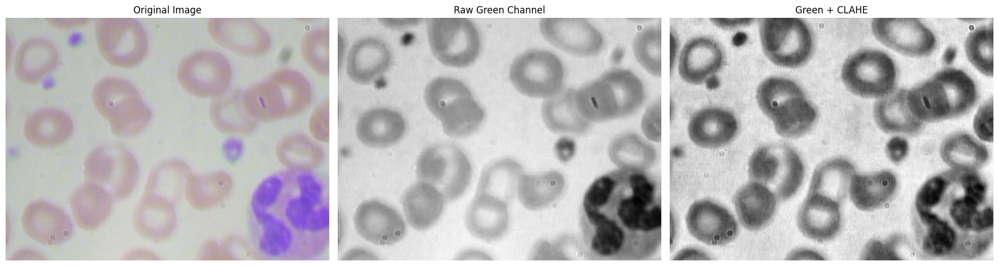

In [13]:
def rbc_extract_and_clahe(image, debug=False):
    g = image[:, :, 1] 
    
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    g_clahe = clahe.apply(g)

    if debug:
        plot_data([image, g, g_clahe], titles=["Original Image", "Raw Green Channel", "Green + CLAHE"])
    
    return g_clahe

sample_g_clahe = rbc_extract_and_clahe(sample_image, debug=True)

To suppress high-frequency noise, Gaussian blurring is applied to the contrast-enhanced Green channel.

The impact of this smoothing operation is visualized by comparing the histograms of the CLAHE-processed channel before and after blurring, demonstrating a more uniform intensity distribution.

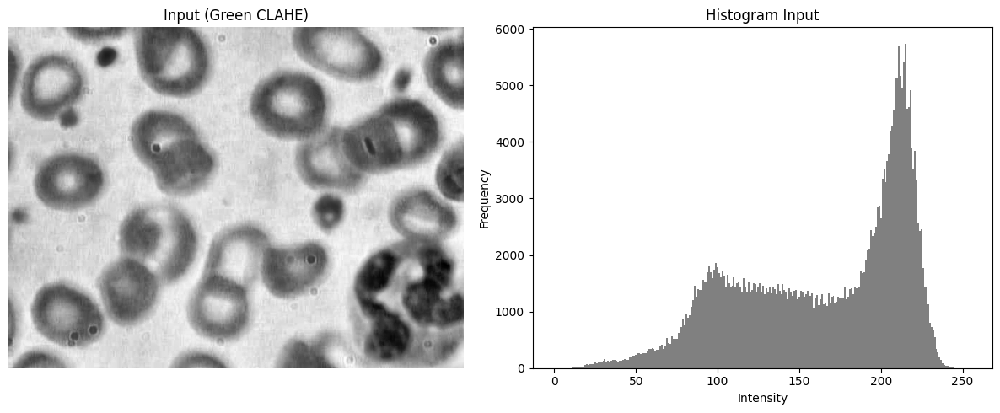

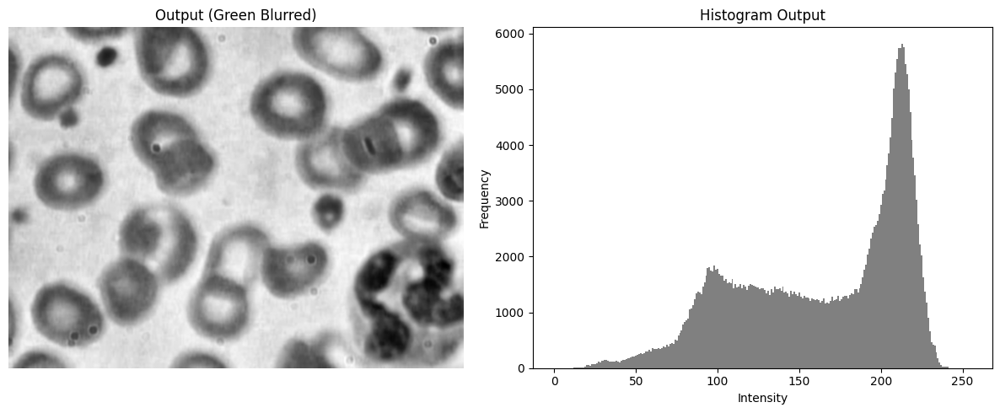

In [14]:
def rbc_blurring_phase(single_channel_image, debug=False):
    g_blurred = apply_gaussian_blur(single_channel_image, (5, 5))
    
    if debug:
        hist_input = get_histogram(single_channel_image)
        
        hist_output = get_histogram(g_blurred)
        
        plot_data(
            [single_channel_image, hist_input], 
            titles=["Input (Green CLAHE)", "Histogram Input"]
        )
        plot_data(
            [g_blurred, hist_output], 
            titles=["Output (Green Blurred)", "Histogram Output"]
        )

    return g_blurred

sample_g_blurred = rbc_blurring_phase(sample_g_clahe, debug=True)

### Detection
To detect the RBCs, an adaptive thresholding algorithm is applied. This process generates a binary mask that effectively separates the cellular foreground from the background.

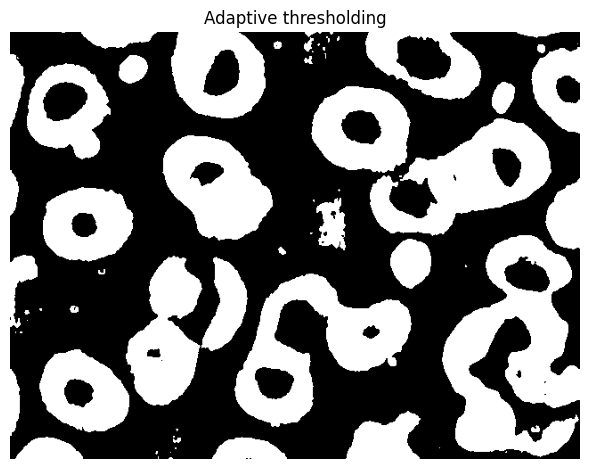

In [15]:
def rbc_apply_thresholding(g_blurred, debug=False):
    thresh = cv2.adaptiveThreshold(
        g_blurred, 
        255, 
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
        cv2.THRESH_BINARY_INV, 
        blockSize=201, 
        C=2
    )

    if debug:
        plot_data([thresh], titles=["Adaptive thresholding"])

    return thresh

sample_thresh = rbc_apply_thresholding(sample_g_blurred, debug=True)

Then, to eliminate artifacts frequently present near White Blood Cells, the WBC mask is moderately dilated and subtracted from the RBC mask. This ensures that the RBC segmentation remains uncontaminated by WBC boundaries.

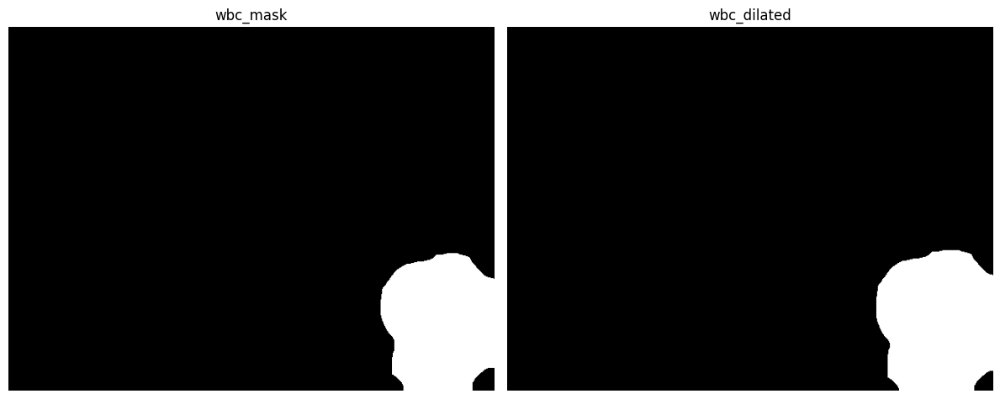

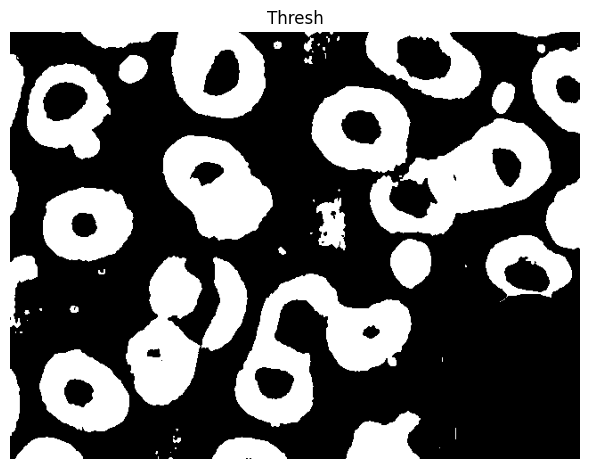

In [16]:
def rbc_remove_wbc_mask(wbc_mask, thresh, debug=False):
    wbc_dilated = cv2.dilate(wbc_mask, np.ones((5,5), np.uint8), iterations=2)
    thresh[wbc_dilated > 0] = 0

    if debug:
        plot_data([wbc_mask, wbc_dilated], titles=["wbc_mask", "wbc_dilated"])
        plot_data([thresh], titles=["Thresh"])

    return thresh

sample_thresh = rbc_remove_wbc_mask(sample_wbc_mask, sample_thresh, debug=True)

Applying the same morphological strategy employed for WBCs, the mask is refined to remove noise and irregularities. The resulting binary map represents the sure background of the image.

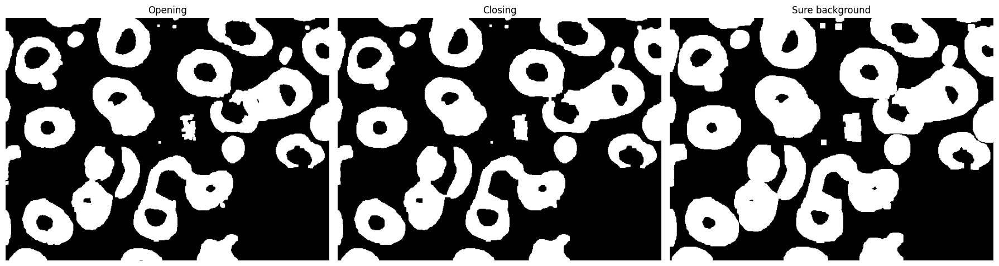

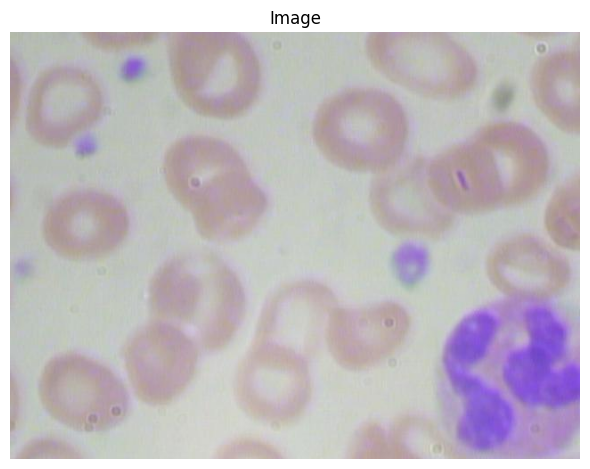

In [17]:
def rbc_get_sure_bg(thresh, debug=False):
    kernel = np.ones((3,3), np.uint8)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel, iterations=3)
    sure_bg = cv2.dilate(closing, kernel, iterations=3)

    if debug:
        plot_data([opening, closing, sure_bg], titles=["Opening", "Closing", "Sure background"])
    
    return sure_bg, closing

sample_sure_bg, sample_closing = rbc_get_sure_bg(sample_thresh, debug=True)
plot_data([sample_image], titles=["Image"])

To prepare for the Watershed algorithm, two critical masks must be defined: the Sure Foreground (cell centers) and the Unknown Region (regions where it can be hard to precisely tell where the countours of the RBCs actually are). To achieve this, a Distance Dransform is used to identify the regions of the cells that are RBCs (i.e. the areas that are far away from the background). Gaussian blurring is then applied to make the watershed algorithm work better later on. 
After that, a threshold is applied to the distance map to isolate the most central regions of the cells, ensuring high confidence that these pixels belong to RBCs.
Lastly, the Unknown Region is derived by subtracting the Sure Foreground from the Sure Background.

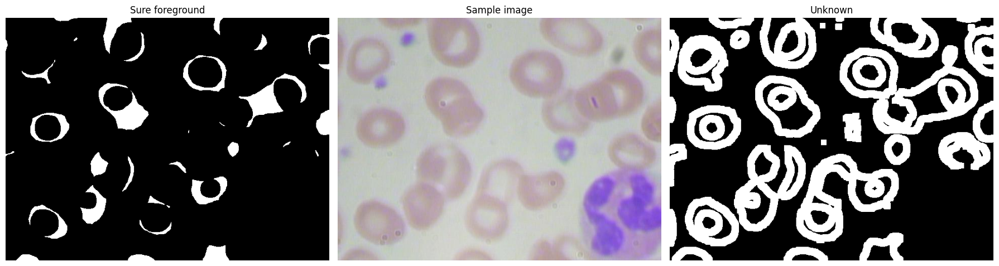

In [18]:
def rbc_get_sure_foreground(closing, sure_bg, debug=False):
    dist_transform = cv2.distanceTransform(closing, cv2.DIST_L2, 5)
    dist_transform = cv2.GaussianBlur(dist_transform, (3, 3), 0)
    ret, sure_fg = cv2.threshold(dist_transform, 0.35 * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    
    if debug:
        plot_data([sure_fg, unknown], titles=["Sure foreground", "Unknown"])
    
    return sure_fg, unknown

sample_sure_fg, sample_unknown = rbc_get_sure_foreground(sample_closing, sample_sure_bg, debug=False)
plot_data([sample_sure_fg, sample_image, sample_unknown], titles=["Sure foreground", "Sample image", "Unknown"])

With the Sure Soreground and Unknown Region masks defined, the Watershed algorithm is applied to execute the final segmentation of Red Blood Cells (RBCs).
Conceptually, this algorithm treats the image as a topographic surface. The Sure Foreground regions serve as markers (seeds) from which a simulated flooding process initiates. The "water" expands from these markers into the Unknown Regions until it converges with expanding regions from adjacent markers. These convergence points form watershed lines, which effectively delineate the boundaries between overlapping cells.

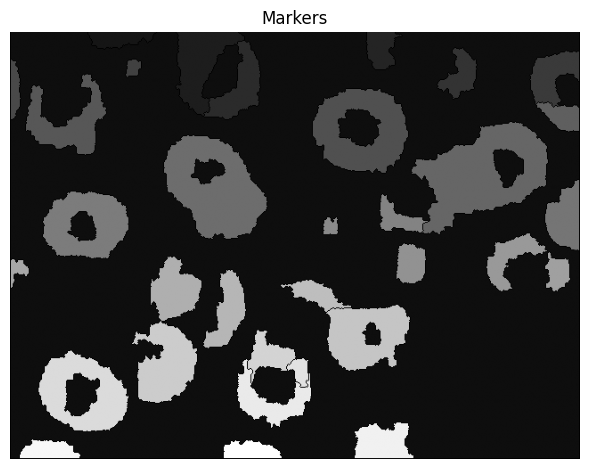

In [19]:
def rbc_apply_watershed(sure_fg, unknown, image, debug=False):
    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    
    markers = cv2.watershed(image, markers)

    if debug:
        plot_data([markers], titles=["Markers"])

    return markers

sample_markers = rbc_apply_watershed(sample_sure_fg, sample_unknown, sample_image, debug=True)

To eliminate residual noise, a size constraint is applied to discard regions that are too small to correspond to a valid Red Blood Cell. The remaining connected components are subsequently enumerated to derive the final cell count.

DEBUG: Using Fixed RBC Area: 6000px. (Min: 2400.0, Clump: 10800.0)
DEBUG: Found 35 unique labels in markers.


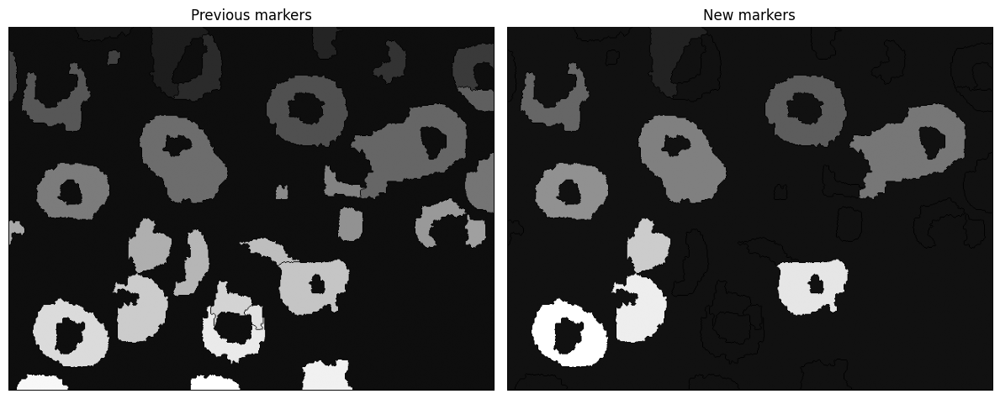

In [20]:
def rbc_size_filtering(typical_rbc_area, markers, debug=False):
    min_thresh = typical_rbc_area * 0.4 # changed to 0.4 from 0.2
    clump_thresh = typical_rbc_area * 1.8

    if debug:
        print(f"DEBUG: Using Fixed RBC Area: {typical_rbc_area}px. (Min: {min_thresh}, Clump: {clump_thresh})")
        
    final_count = 0
    new_markers = markers.copy()
    
    labels = np.unique(markers)

    if debug:
        print(f"DEBUG: Found {len(labels)} unique labels in markers.") 
    
    for label in labels:
        if label <= 1: continue
        
        area = np.sum(markers == label)
        
        if area < min_thresh:
            new_markers[markers == label] = 1 
        elif area > clump_thresh:
            estimated_cells = int(round(area / typical_rbc_area))
            print(f"   -> Found Clump (Area {area}). Estimated as {estimated_cells} cells.")
            final_count += estimated_cells
        else:
            final_count += 1

    if debug:
        plot_data([markers, new_markers], titles=["Previous markers", "New markers"])
    
    return new_markers, final_count

sample_new_markers, sample_count = rbc_size_filtering(6000, sample_markers, debug=True)

Here is a funciton that encapsulates the entire RBC logic to ensure modularity.

RBC Count detected: 10


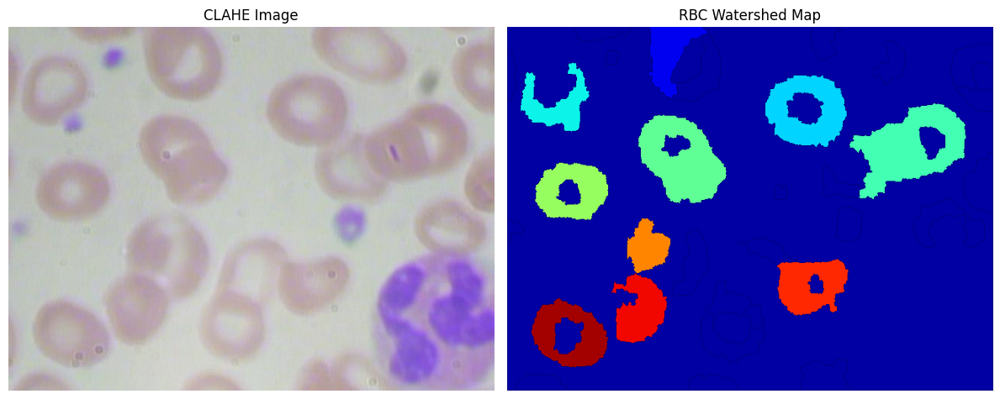

In [21]:
def get_rbc_watershed(image, wbc_mask, typical_rbc_area=6000):
    g_clahe = rbc_extract_and_clahe(image, debug=False)    
    
    g_blurred = rbc_blurring_phase(g_clahe, debug=False)    
    
    thresh = rbc_apply_thresholding(g_blurred)
    
    thresh = rbc_remove_wbc_mask(wbc_mask, thresh)
    
    sure_bg, closing = rbc_get_sure_bg(thresh)
    
    sure_fg, unknown = rbc_get_sure_foreground(closing, sure_bg)

    markers = rbc_apply_watershed(sure_fg, unknown, image)

    new_markers, count = rbc_size_filtering(typical_rbc_area=typical_rbc_area, markers=markers)

    return new_markers, count
    
FIXED_AREA = 6000 
sample_markers, sample_rbc_count = get_rbc_watershed(sample_image, sample_wbc_mask, typical_rbc_area=FIXED_AREA)

sample_colored_markers = plt.cm.jet(sample_markers / (np.max(sample_markers) + 1))
sample_colored_markers = (sample_colored_markers[:, :, :3] * 255).astype(np.uint8)
sample_final_markers_bgr = cv2.cvtColor(sample_colored_markers, cv2.COLOR_RGB2BGR)

print(f"RBC Count detected: {sample_rbc_count}")
plot_data([sample_image, sample_final_markers_bgr], titles=["CLAHE Image", "RBC Watershed Map"])

## Full pipeline
Below, the full pipeline is defined inside a wrapper class, so all the steps described above can be easily applied to all the images in the dataset

✅ Image found: /kaggle/input/bccd-blood-cell-count-and-detection-dataset/test/img/BloodImage_00375.jpeg
📊 Ground Truth -> WBC: 1, RBC: 12, Platelets: 2


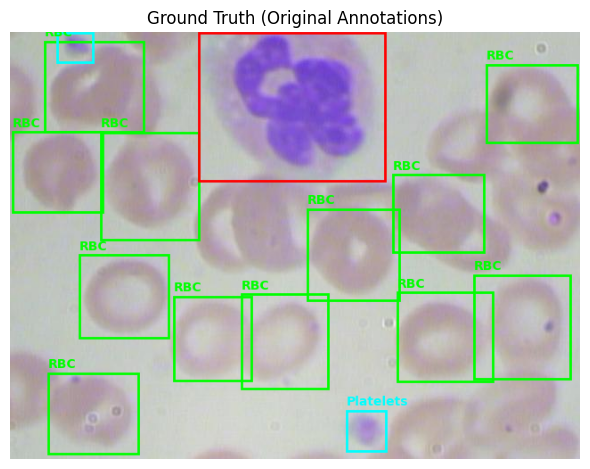


🚀 Running Detection Pipeline...
--- Pipeline Result: WBC=1, RBC=11, Platelets=3 ---


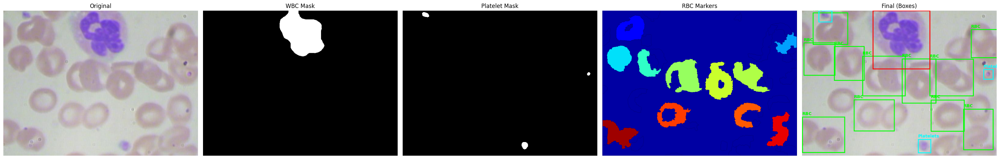

In [22]:
class ClassicalCellDetector:
    def __init__(self):
        self.lower_purple = np.array([79, 77, 109])
        self.upper_purple = np.array([151, 212, 212])
        self.typical_rbc_area = 6000

    def detect_wbc(self, image):
        gaussian_blurred = apply_gaussian_blur(image)
        hsv_image = cv2.cvtColor(gaussian_blurred, cv2.COLOR_BGR2HSV)
        mask, count = get_wbc_mask(hsv_image, self.lower_purple, self.upper_purple)
        return mask, count

    def detect_platelets(self, image, wbc_mask):
        gaussian_blurred = apply_gaussian_blur(image)
        hsv_image = cv2.cvtColor(gaussian_blurred, cv2.COLOR_BGR2HSV)
        mask, count = get_platelet_mask(hsv_image, wbc_mask, self.lower_purple, self.upper_purple)
        return mask, count

    def detect_rbc(self, image, wbc_mask):
        rbc_markers, rbc_count = get_rbc_watershed(image, wbc_mask, typical_rbc_area=self.typical_rbc_area)
        return rbc_markers, rbc_count
    
    def run_pipeline(self, image, visualize=False):
        clahe_image = apply_CLAHE(image)
        
        wbc_mask, wbc_count = self.detect_wbc(clahe_image.copy())

        platelet_mask, platelet_count = self.detect_platelets(clahe_image.copy(), wbc_mask)

        rbc_markers, rbc_count = self.detect_rbc(image.copy(), wbc_mask)
        
        # --- Visualization ---
        detections = markers_to_detections(rbc_markers, wbc_mask, platelet_mask)
        vis_boxes = visualize_detections(image.copy(), detections)
        
        vis_regions = image.copy()
        
        # Red = WBC
        cnts_wbc, _ = cv2.findContours(wbc_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cv2.drawContours(vis_regions, cnts_wbc, -1, (0, 0, 255), 2)
        
        # Cyan = Platelets
        cnts_plat, _ = cv2.findContours(platelet_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cv2.drawContours(vis_regions, cnts_plat, -1, (255, 255, 0), 2)

        # Green = RBC
        labels = np.unique(rbc_markers)
        for label in labels:
            if label <= 1: continue
            cell_mask = np.zeros(rbc_markers.shape, dtype="uint8")
            cell_mask[rbc_markers == label] = 255
            cnts_cell, _ = cv2.findContours(cell_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            cv2.drawContours(vis_regions, cnts_cell, -1, (0, 255, 0), 1)

        if visualize:
            print(f"--- Pipeline Result: WBC={wbc_count}, RBC={rbc_count}, Platelets={platelet_count} ---")
            
            marker_colored = plt.cm.jet(rbc_markers / (np.max(rbc_markers) + 1)) 
            marker_colored = (marker_colored[:, :, :3] * 255).astype(np.uint8)   
            marker_bgr = cv2.cvtColor(marker_colored, cv2.COLOR_RGB2BGR)         

            plot_data(
                [image, wbc_mask, platelet_mask, marker_bgr, vis_boxes], 
                titles=[
                    "Original", 
                    "WBC Mask", 
                    "Platelet Mask", 
                    "RBC Markers", 
                    "Final (Boxes)"
                ]
            )

        return {
            'wbc_count': wbc_count,
            'rbc_count': rbc_count,
            'platelet_count': platelet_count,
            'detections': detections,
            'final_vis': vis_boxes 
        }

img_path = '/kaggle/input/bccd-blood-cell-count-and-detection-dataset/test/img/BloodImage_00375.jpeg'

if os.path.exists(img_path):
    print(f"✅ Image found: {img_path}")
    
    detector = ClassicalCellDetector()
    
    image = get_image(img_path)
    
    try:
        ann_path = get_annotations_path(img_path)
        gt_data = get_annotations(ann_path)
        
        # Calculate GT counts
        gt_wbc = sum(1 for obj in gt_data.get('objects', []) if obj['classTitle'] == 'WBC')
        gt_rbc = sum(1 for obj in gt_data.get('objects', []) if obj['classTitle'] == 'RBC')
        gt_platelets = sum(1 for obj in gt_data.get('objects', []) if obj['classTitle'] == 'Platelets')
        
        print(f"📊 Ground Truth -> WBC: {gt_wbc}, RBC: {gt_rbc}, Platelets: {gt_platelets}")
        
        annotated_img = get_annotated_image(image, gt_data)
        plot_data([annotated_img], titles=["Ground Truth (Original Annotations)"])
        
    except Exception as e:
        print(f"⚠️ Could not load annotations: {e}")

    print("\n🚀 Running Detection Pipeline...")
    result = detector.run_pipeline(image, visualize=True)
else:
    print(f"❌ Error: File not found at {img_path}")

# Deep Learning (YOLOv8)
Just for the sake of comparison, a deep learning model based on the YOLOv8 architecture is implemented. The dataset's volume allows for the effective fine-tuning of this object detection model.

**Steps:**
1. **Data Prep:** The original annotations, provided in XML (VOC) format, are converted to the YOLO-compliant TXT format. The directory structure is reorganized within `/kaggle/working`, and the requisite `data.yaml`configuration file is generated to define the dataset paths.
2. **Training:** The pre-trained `yolov8n.pt` model is fine-tuned using the training subset to adapt to the specific features of blood cells.
3. **Inference:** The model is evaluated on the test set to detect blood cells and compare its results with the classical pipeline.

Implementation Note: While the code below outlines the complete fine-tuning logic, a pre-trained model artifact (generated in a separate session) is imported. This ensures computational efficiency by avoiding redundant training cycles during the notebook's execution.

Here, the conversion step is performed and the file `data.yaml` is created

In [23]:
WORK_DIR = '/kaggle/working/bccd_yolo'
classes = ['WBC', 'RBC', 'Platelets']
class_map = {name: i for i, name in enumerate(classes)}

# Clean old data
if os.path.exists(WORK_DIR): shutil.rmtree(WORK_DIR)

def process_split(split_name):
    print(f"🚀 Processing {split_name}...")
    
    base_input = f'/kaggle/input/bccd-blood-cell-count-and-detection-dataset/{split_name}'
    src_img_dir = os.path.join(base_input, 'img')
    src_ann_dir = os.path.join(base_input, 'ann')
    
    dst_img_dir = os.path.join(WORK_DIR, 'images', split_name)
    dst_lbl_dir = os.path.join(WORK_DIR, 'labels', split_name)
    os.makedirs(dst_img_dir, exist_ok=True)
    os.makedirs(dst_lbl_dir, exist_ok=True)
    
    images = glob.glob(os.path.join(src_img_dir, '*.jpeg'))
    
    count = 0
    
    for img_path in images:
        filename = os.path.basename(img_path) 
        
        # Match JSON file (Exact match: image.jpeg -> image.jpeg.json)
        json_path = os.path.join(src_ann_dir, filename + ".json")
        
        if os.path.exists(json_path):
            shutil.copy(img_path, os.path.join(dst_img_dir, filename))
            
            try:
                with open(json_path, 'r') as f:
                    data = json.load(f)
                
                img_h = data['size']['height']
                img_w = data['size']['width']
                
                txt_filename = os.path.splitext(filename)[0] + ".txt"
                txt_path = os.path.join(dst_lbl_dir, txt_filename)
                
                valid_objs = 0
                with open(txt_path, 'w') as f_out:
                    for obj in data['objects']:
                        # Extract Class Title
                        label = obj['classTitle']
                        if label not in class_map: continue
                        
                        cls_id = class_map[label]
                        
                        # Extract Coordinates
                        # exterior is [[x_min, y_min], [x_max, y_max]]
                        points = obj['points']['exterior']
                        x1, y1 = points[0]
                        x2, y2 = points[1]
                        
                        xmin = min(x1, x2)
                        ymin = min(y1, y2)
                        xmax = max(x1, x2)
                        ymax = max(y1, y2)
                        
                        # Normalize for YOLO
                        x_center = ((xmin + xmax) / 2) / img_w
                        y_center = ((ymin + ymax) / 2) / img_h
                        width = (xmax - xmin) / img_w
                        height = (ymax - ymin) / img_h
                        
                        # Write line
                        f_out.write(f"{cls_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")
                        valid_objs += 1
                
                if valid_objs > 0:
                    count += 1
                    
            except Exception as e:
                print(f"⚠️ Error parsing {filename}: {e}")
    
    print(f"   -> Successfully converted {count} labels for {split_name}.")

# Run Conversion
process_split('train')
process_split('val')
process_split('test')

# Create data.yaml
yaml_content = f"""
path: {WORK_DIR}
train: images/train
val: images/val
test: images/test
nc: 3
names: {classes}
"""
with open(os.path.join(WORK_DIR, 'data.yaml'), 'w') as f:
    f.write(yaml_content)

print("\n✅ Dataset Ready. You can now train YOLO.")

🚀 Processing train...
   -> Successfully converted 205 labels for train.
🚀 Processing val...
   -> Successfully converted 87 labels for val.
🚀 Processing test...
   -> Successfully converted 72 labels for test.

✅ Dataset Ready. You can now train YOLO.


Here, we can decide whether we want to fine-tune the model or use the existing one

In [24]:
# Set to False because we want to use your uploaded dataset
TRAIN_NEW_MODEL = False 

SAVED_MODEL_PATH = '/kaggle/input/bccd-yolo-weights-v1/best.pt' 

if TRAIN_NEW_MODEL:
    print("🔄 Starting new training session...")
    
    model = YOLO('yolov8n.pt') 
    
    results = model.train(
        data=os.path.join(WORK_DIR, 'data.yaml'),
        epochs=50,     
        imgsz=640,
        batch=32,
        project='bccd_project',
        name='yolo_bccd',
        verbose=False,
        exist_ok=True # Added security to avoid creating duplicate folders
    )
    
    path_to_best_model = str(model.trainer.best)
    print(f"✅ Training completed. Best model saved at: {path_to_best_model}")

else:
    print("⏩ Skipping training. Loading existing model...")
    
    # Check if the file actually exists
    if os.path.exists(SAVED_MODEL_PATH):
        model = YOLO(SAVED_MODEL_PATH)
        path_to_best_model = SAVED_MODEL_PATH
        print(f"✅ Model successfully loaded from: {SAVED_MODEL_PATH}")
    else:
        print(f"❌ Error: File not found at {SAVED_MODEL_PATH}")
        print("📂 Content of /kaggle/input:")
        print(os.listdir('/kaggle/input'))
        raise FileNotFoundError(
            "Solution: Check the printed list above. Copy the correct folder name into SAVED_MODEL_PATH."
        )

# --- VALIDATION ---
print("\n📊 Running validation...")
metrics = model.val(data=os.path.join(WORK_DIR, 'data.yaml'))

⏩ Skipping training. Loading existing model...
✅ Model successfully loaded from: /kaggle/input/bccd-yolo-weights-v1/best.pt

📊 Running validation...
Ultralytics 8.4.12 🚀 Python-3.12.12 torch-2.8.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
Model summary (fused): 73 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 394.2±104.5 MB/s, size: 20.7 KB)
val: Scanning /kaggle/working/bccd_yolo/labels/val... 87 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 87/87 1.1Kit/s 0.1s
val: New cache created: /kaggle/working/bccd_yolo/labels/val.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 2.1s/it 12.9s
                   all         87       1138      0.863      0.877      0.909      0.622
                   WBC         86         87      0.984          1      0.991      0.813
                   RBC         83        968      0.805      0.787      0.873      0.627
             P

# Analysis of the test set

After setting up both the classical pipeline and the YOLO model, a comparative performance assessment is conducted using the test dataset.

🚀 Running comparison on 4 images from TEST set...

--- Pipeline Result: WBC=1, RBC=18, Platelets=0 ---


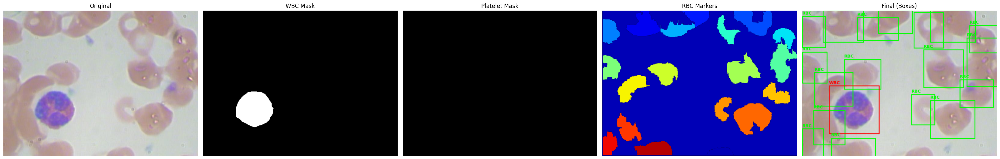

Processing: BloodImage_00062.jpeg


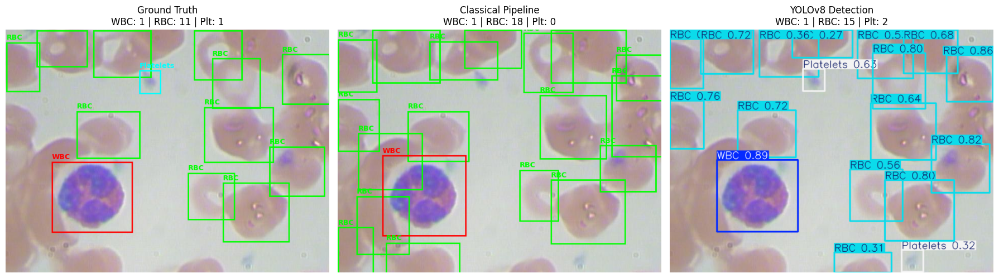

------------------------------------------------------------
   -> Found Clump (Area 11254). Estimated as 2 cells.
   -> Found Clump (Area 11637). Estimated as 2 cells.
--- Pipeline Result: WBC=1, RBC=16, Platelets=0 ---


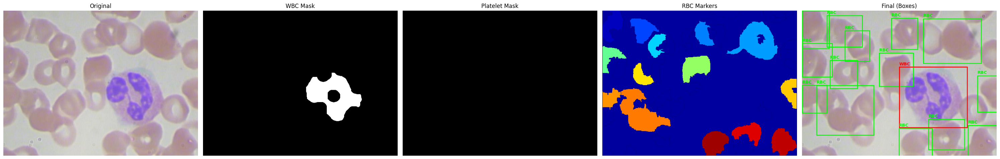

Processing: BloodImage_00234.jpeg


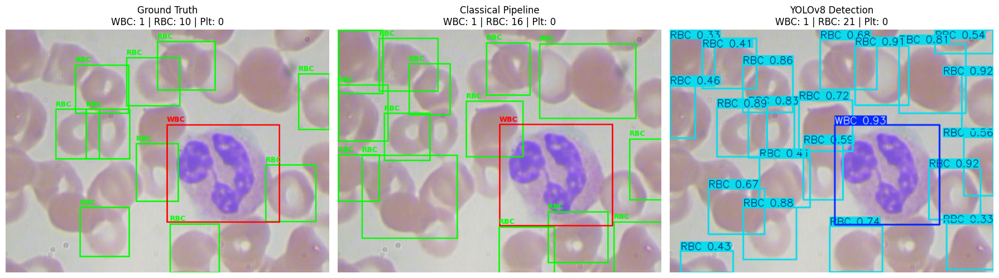

------------------------------------------------------------
--- Pipeline Result: WBC=1, RBC=13, Platelets=0 ---


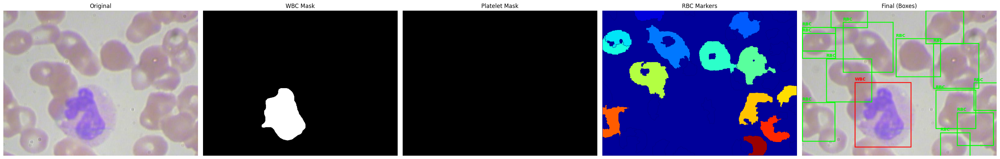

Processing: BloodImage_00227.jpeg


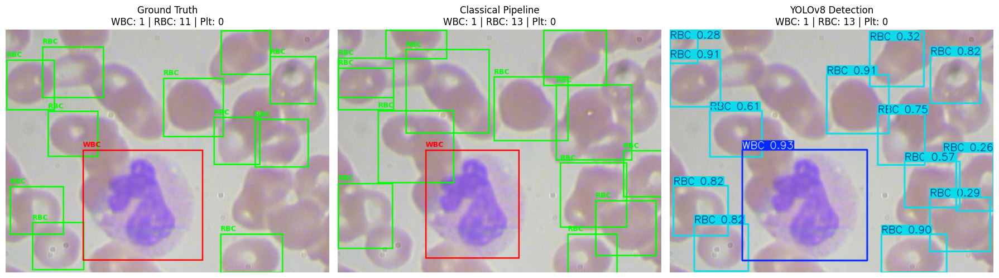

------------------------------------------------------------
--- Pipeline Result: WBC=2, RBC=15, Platelets=1 ---


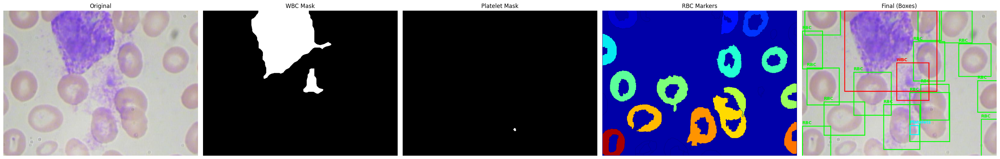

Processing: BloodImage_00171.jpeg


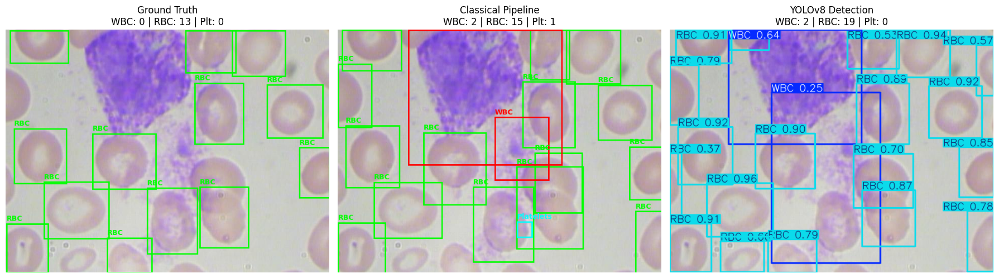

------------------------------------------------------------


In [25]:
detector = ClassicalCellDetector()

def visualize_batch_comparison(num_samples=3):
    test_img_dir = DIRS['test']['img']
    all_images = glob.glob(os.path.join(test_img_dir, '*.jpeg'))
    
    if not all_images:
        print(f"❌ Error: No images found in {test_img_dir}")
        return

    # Select random samples
    samples = random.sample(all_images, min(num_samples, len(all_images)))
    
    print(f"🚀 Running comparison on {len(samples)} images from TEST set...\n")

    for img_path in samples:
        image = get_image(img_path)
        if image is None: continue

        ann_path = get_annotations_path(img_path)
        annotations = get_annotations(ann_path)
        
        gt_wbc = sum(1 for obj in annotations.get('objects', []) if obj['classTitle'] == 'WBC')
        gt_rbc = sum(1 for obj in annotations.get('objects', []) if obj['classTitle'] == 'RBC')
        gt_plat = sum(1 for obj in annotations.get('objects', []) if obj['classTitle'] == 'Platelets')
        
        gt_vis = get_annotated_image(image, annotations)

        res_class = detector.run_pipeline(image, visualize=True)
        class_vis = res_class['final_vis']
        c_wbc = res_class['wbc_count']
        c_rbc = res_class['rbc_count']
        c_plat = res_class['platelet_count']

        try:
            results = model.predict(img_path, conf=0.25, verbose=False)
            yolo_res = results[0]
            yolo_vis = yolo_res.plot()
            
            if yolo_res.boxes:
                cls_ids = yolo_res.boxes.cls.cpu().numpy()
                y_wbc = np.sum(cls_ids == 0)
                y_rbc = np.sum(cls_ids == 1)
                y_plat = np.sum(cls_ids == 2) 
            else:
                y_wbc, y_rbc, y_plat = 0, 0, 0
        except Exception as e:
            print(f"⚠️ YOLO Error: {e}")
            y_wbc, y_rbc, y_plat = 0, 0, 0
            yolo_vis = image.copy()

        # --- VISUALIZATION ---
        
        images_to_show = [gt_vis, class_vis, yolo_vis]
        
        titles = [
            f"Ground Truth\nWBC: {gt_wbc} | RBC: {gt_rbc} | Plt: {gt_plat}",
            f"Classical Pipeline\nWBC: {c_wbc} | RBC: {c_rbc} | Plt: {c_plat}",
            f"YOLOv8 Detection\nWBC: {y_wbc} | RBC: {y_rbc} | Plt: {y_plat}"
        ]
        
        print(f"Processing: {os.path.basename(img_path)}")
        plot_data(images_to_show, titles=titles)
        print("-" * 60)

visualize_batch_comparison(num_samples=4)

After getting the results of the test set, we plot the results

Notably, a data cleaning filter was applied prior to visualization: images containing fewer than 5 Red Blood Cells or fewer than 1 White Blood Cell were excluded from the comparison. This constraint was introduced to mitigate the impact of specific ground truth anomalies where the dataset annotations were incomplete or incorrect.

📊 Starting Ultimate Benchmark on 72 images...
   -> Found Clump (Area 12540). Estimated as 2 cells.
   -> Found Clump (Area 13118). Estimated as 2 cells.
   -> Found Clump (Area 13120). Estimated as 2 cells.
   -> Found Clump (Area 16279). Estimated as 3 cells.
   -> Found Clump (Area 10898). Estimated as 2 cells.
   -> Found Clump (Area 11254). Estimated as 2 cells.
   -> Found Clump (Area 11637). Estimated as 2 cells.
   -> Found Clump (Area 21217). Estimated as 4 cells.
   -> Found Clump (Area 14119). Estimated as 2 cells.
   -> Found Clump (Area 15500). Estimated as 3 cells.
   -> Found Clump (Area 11323). Estimated as 2 cells.
   -> Found Clump (Area 15838). Estimated as 3 cells.
   -> Found Clump (Area 13122). Estimated as 2 cells.
   -> Found Clump (Area 13120). Estimated as 2 cells.
   -> Found Clump (Area 13337). Estimated as 2 cells.
   -> Found Clump (Area 11625). Estimated as 2 cells.
   -> Found Clump (Area 11086). Estimated as 2 cells.
   -> Found Clump (Area 16909). Esti

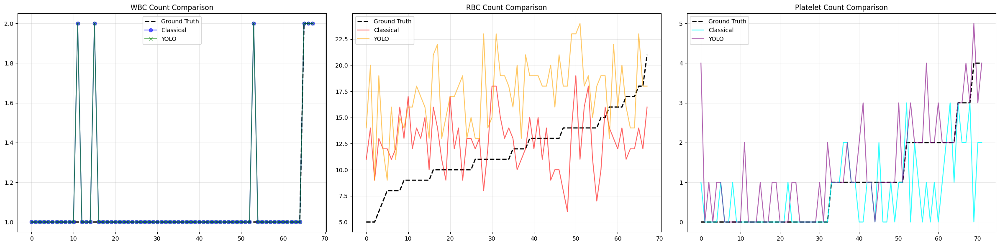

In [26]:
def run_ultimate_benchmark(num_samples=73):
    test_img_dir = DIRS['test']['img']
    all_images = glob.glob(os.path.join(test_img_dir, '*.jpeg'))
                 
    if not all_images: 
        print("❌ No images found.")
        return
    
    # Random sampling
    samples = random.sample(all_images, min(num_samples, len(all_images)))
    results_list = []
    
    print(f"📊 Starting Ultimate Benchmark on {len(samples)} images...")

    for i, img_path in enumerate(samples):
        filename = os.path.basename(img_path)
        
        ann_path = get_annotations_path(img_path)
        ann_data = get_annotations(ann_path)
        
        gt_wbc_boxes = []
        gt_rbc_boxes = []
        gt_platelet_boxes = []
        
        for obj in ann_data.get('objects', []):
            if obj['geometryType'] == 'rectangle':
                p1, p2 = obj['points']['exterior'] 
                box = [p1[0], p1[1], p2[0], p2[1]]
                
                if obj['classTitle'] == 'WBC': gt_wbc_boxes.append(box)
                elif obj['classTitle'] == 'RBC': gt_rbc_boxes.append(box)
                elif obj['classTitle'] == 'Platelets': gt_platelet_boxes.append(box)
        
        gt_wbc = len(gt_wbc_boxes)
        gt_rbc = len(gt_rbc_boxes)
        gt_plat = len(gt_platelet_boxes)

        # Classical Pipeline
        try:
            res_class = detector.run_pipeline(get_image(img_path), visualize=False)
            class_wbc = res_class['wbc_count']
            class_rbc = res_class['rbc_count']
            class_plat = res_class['platelet_count']
            
            class_wbc_boxes = [] 
            class_rbc_boxes = []
            class_platelet_boxes = []
            
            if 'detections' in res_class:
                 for d in res_class['detections']:
                     x, y, w, h = d['box']
                     box_fmt = [x, y, x+w, y+h] # Convert to x1, y1, x2, y2
                     
                     if d['classTitle'] == 'RBC':
                         class_rbc_boxes.append(box_fmt)
                     elif d['classTitle'] == 'WBC':
                         class_wbc_boxes.append(box_fmt)
                     elif d['classTitle'] == 'Platelets':
                         class_platelet_boxes.append(box_fmt)
                      
        except Exception as e:
            print(f"Classical Pipeline Error on {filename}: {e}")
            class_wbc, class_rbc, class_plat = 0, 0, 0
            class_rbc_boxes, class_wbc_boxes, class_platelet_boxes = [], [], []

        # YOLOv8 Prediction
        try:
            yolo_res = model.predict(img_path, conf=0.25, verbose=False)[0]
            yolo_wbc_boxes = []
            yolo_rbc_boxes = []
            yolo_platelet_boxes = []
            
            if yolo_res.boxes:
                for box in yolo_res.boxes:
                    coords = box.xyxy[0].cpu().numpy().tolist()
                    cls_id = int(box.cls[0])
                    
                    # MAPPING: 0=WBC, 1=RBC, 2=Platelets
                    if cls_id == 0: yolo_wbc_boxes.append(coords)
                    elif cls_id == 1: yolo_rbc_boxes.append(coords)
                    elif cls_id == 2: yolo_platelet_boxes.append(coords)
            
            yolo_wbc = len(yolo_wbc_boxes)
            yolo_rbc = len(yolo_rbc_boxes)
            yolo_plat = len(yolo_platelet_boxes)
            
        except Exception:
            yolo_wbc, yolo_rbc, yolo_plat = 0, 0, 0
            yolo_rbc_boxes, yolo_wbc_boxes, yolo_platelet_boxes = [], [], []

        # IoU Calculation
        # WBC
        iou_class_wbc = compute_image_iou(gt_wbc_boxes, class_wbc_boxes)
        iou_yolo_wbc = compute_image_iou(gt_wbc_boxes, yolo_wbc_boxes)
        
        # RBC
        iou_class_rbc = compute_image_iou(gt_rbc_boxes, class_rbc_boxes)
        iou_yolo_rbc = compute_image_iou(gt_rbc_boxes, yolo_rbc_boxes)
        
        # PLATELETS
        iou_class_plat = compute_image_iou(gt_platelet_boxes, class_platelet_boxes)
        iou_yolo_plat = compute_image_iou(gt_platelet_boxes, yolo_platelet_boxes)

        # Store Results
        results_list.append({
            'Filename': filename,
            
            # Counts
            'GT_WBC': gt_wbc, 'GT_RBC': gt_rbc, 'GT_Plt': gt_plat,
            'Class_WBC': class_wbc, 'Class_RBC': class_rbc, 'Class_Plt': class_plat,
            'YOLO_WBC': yolo_wbc, 'YOLO_RBC': yolo_rbc, 'YOLO_Plt': yolo_plat,
            
            # Absolute Errors
            'Err_Class_WBC': abs(gt_wbc - class_wbc),
            'Err_Class_RBC': abs(gt_rbc - class_rbc),
            'Err_Class_Plt': abs(gt_plat - class_plat),
            
            'Err_YOLO_WBC': abs(gt_wbc - yolo_wbc),
            'Err_YOLO_RBC': abs(gt_rbc - yolo_rbc),
            'Err_YOLO_Plt': abs(gt_plat - yolo_plat),
            
            # IoU
            'IoU_Class_WBC': iou_class_wbc,
            'IoU_YOLO_WBC': iou_yolo_wbc,
            'IoU_Class_RBC': iou_class_rbc,
            'IoU_YOLO_RBC': iou_yolo_rbc,
            'IoU_Class_Plt': iou_class_plat,
            'IoU_YOLO_Plt': iou_yolo_plat
        })

    df = pd.DataFrame(results_list)
    
    # FILTERS FOR ANALYTICS
    df_valid_wbc = df[df['GT_WBC'] >= 1].copy()
    df_valid_rbc = df[df['GT_RBC'] >= 5].copy()
    df_valid_plat = df[df['GT_Plt'] >= 0].copy()

    # FINAL SCOREBOARD
    print("\n" + "="*60)
    print("BENCHMARK RESULTS (WBC + RBC + PLATELETS)")
    print("="*60)
    
    # WBC SECTION
    print("\n--- WHITE BLOOD CELLS (WBC) ---")
    print(f"Counting Error (MAE ± STD):")
    print(f"  > Classical: {df_valid_wbc['Err_Class_WBC'].mean():.2f} ± {df_valid_wbc['Err_Class_WBC'].std():.2f}")
    print(f"  > YOLO     : {df_valid_wbc['Err_YOLO_WBC'].mean():.2f} ± {df_valid_wbc['Err_YOLO_WBC'].std():.2f}")
    print(f"Localization (Mean IoU):")
    print(f"  > Classical: {df_valid_wbc['IoU_Class_WBC'].mean()*100:.1f}%")
    print(f"  > YOLO     : {df_valid_wbc['IoU_YOLO_WBC'].mean()*100:.1f}%")

    # RBC SECTION
    print("\n--- RED BLOOD CELLS (RBC) ---")
    print(f"Counting Error (MAE ± STD):")
    print(f"  > Classical: {df_valid_rbc['Err_Class_RBC'].mean():.2f} ± {df_valid_rbc['Err_Class_RBC'].std():.2f}")
    print(f"  > YOLO     : {df_valid_rbc['Err_YOLO_RBC'].mean():.2f} ± {df_valid_rbc['Err_YOLO_RBC'].std():.2f}")
    print(f"Localization (Mean IoU):")
    print(f"  > Classical: {df_valid_rbc['IoU_Class_RBC'].mean()*100:.1f}%")
    print(f"  > YOLO     : {df_valid_rbc['IoU_YOLO_RBC'].mean()*100:.1f}%")

    # PLATELETS SECTION
    print("\n--- PLATELETS (Plt) ---")
    print(f"Counting Error (MAE ± STD):")
    print(f"  > Classical: {df_valid_plat['Err_Class_Plt'].mean():.2f} ± {df_valid_plat['Err_Class_Plt'].std():.2f}")
    print(f"  > YOLO     : {df_valid_plat['Err_YOLO_Plt'].mean():.2f} ± {df_valid_plat['Err_YOLO_Plt'].std():.2f}")
    print(f"Localization (Mean IoU):")
    print(f"  > Classical: {df_valid_plat['IoU_Class_Plt'].mean()*100:.1f}%")
    print(f"  > YOLO     : {df_valid_plat['IoU_YOLO_Plt'].mean()*100:.1f}%")

    print("="*60)
    
    plt.figure(figsize=(24, 6))
    
    # Plot WBC
    plt.subplot(1, 3, 1)
    df_wbc_sorted = df_valid_wbc.sort_values(by='GT_WBC').reset_index(drop=True)
    plt.plot(df_wbc_sorted['GT_WBC'], label='Ground Truth', color='black', linestyle='--', linewidth=2)
    plt.plot(df_wbc_sorted['Class_WBC'], label='Classical', color='blue', alpha=0.6, marker='o')
    plt.plot(df_wbc_sorted['YOLO_WBC'], label='YOLO', color='green', alpha=0.6, marker='x')
    plt.title(f"WBC Count Comparison")
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Plot RBC
    plt.subplot(1, 3, 2)
    if len(df_valid_rbc) > 0:
        df_rbc_sorted = df_valid_rbc.sort_values(by='GT_RBC').reset_index(drop=True)
        plt.plot(df_rbc_sorted['GT_RBC'], label='Ground Truth', color='black', linestyle='--', linewidth=2)
        plt.plot(df_rbc_sorted['Class_RBC'], label='Classical', color='red', alpha=0.6)
        plt.plot(df_rbc_sorted['YOLO_RBC'], label='YOLO', color='orange', alpha=0.6)
        plt.title(f"RBC Count Comparison")
    else:
        plt.text(0.5, 0.5, "No valid RBC Data", ha='center')
    plt.legend()
    plt.grid(True, alpha=0.3)

    # Plot Platelets
    plt.subplot(1, 3, 3)
    if len(df_valid_plat) > 0:
        df_plat_sorted = df_valid_plat.sort_values(by='GT_Plt').reset_index(drop=True)
        plt.plot(df_plat_sorted['GT_Plt'], label='Ground Truth', color='black', linestyle='--', linewidth=2)
        plt.plot(df_plat_sorted['Class_Plt'], label='Classical', color='cyan', alpha=0.8)
        plt.plot(df_plat_sorted['YOLO_Plt'], label='YOLO', color='purple', alpha=0.6)
        plt.title(f"Platelet Count Comparison")
    else:
        plt.text(0.5, 0.5, "No valid Platelet Data", ha='center')
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('ultimate_benchmark_full.png')
    plt.show()
    
    return df

df_final = run_ultimate_benchmark()

Based on the quantitative metrics, the following conclusions can be drawn:
- **White Blood Cells (WBC)**: Both models demonstrate exceptional performance in counting (in fact they are exactly equal), however YOLO exhibits superior localization capabilities (89.2% IoU), indicating tighter and more accurate bounding boxes around the cells compared to the morphological masks.
- **Red Blood Cells (RBC)**: A superficial analysis of the MAE suggests that the classical pipeline performs comparably to or even slightly better than the Deep Learning model regarding raw counts. However, the localization metric (IoU) reveals a critical disparity. YOLO achieves an IoU of 80.2%, significantly outperforming the classical pipeline (50.9%). This indicates that while the classical approach may estimate the quantity of cells reasonably well, it fails to accurately define their boundaries. YOLO provides far superior spatial localization, proving it to be the more robust detector despite the similar counting statistics.
- **Platelets**: The results for platelets mirror the trend observed in RBC detection, with the classical pipeline generally detecting fewer instances than the YOLO model. Notably, platelet detection represents arguably the most challenging task for the classical computer vision approach. Due to their minute size, platelets are morphologically similar to background artifacts. This creates a high sensitivity to parameter tuning: aggressive filtering to remove noise often eliminates valid platelets (False Negatives), while lenient filtering leads to the misclassification of dust or noise as cells (False Positives).

**Assessment of Ground Truth Reliability**\
The interpretation of the benchmark results presented above requires a critical qualification. The quantitative metrics (MAE, IoU) were derived by comparing the model predictions against the dataset's Ground Truth (GT) annotations.

However, qualitative inspection reveals that the Ground Truth itself is frequently unreliable. The dataset suffers from systematic under-annotation, where clearly visible cells (particularly RBCs and Platelets) are missing from the label files.

Implications for Validity: This inconsistency directly compromises the "solidness" of the reported metrics. In many instances where the models appear to fail (e.g., a "False Positive" detection), they are in fact correctly identifying cells that the human annotator missed. Consequently, the reported error rates likely underestimate the true performance of both the classical and YOLO pipelines, as the models are essentially being penalized for outperforming the flawed human labels.

Given the suspected incompleteness of the dataset, specific subsets of images are visualized to verify the reliability of the Ground Truth labels against the model predictions. This qualitative inspection aims to distinguish between algorithmic errors and incorrect dataset annotations. The analysis focuses on critical scenarios, including images where the Ground Truth lists fewer than one White Blood Cell or fewer than five Red Blood Cells. Additionally, a specific "stress test" is conducted on instances where both the Classical Pipeline and YOLO detect two White Blood Cells despite the Ground Truth claiming only one.

🔍 Viewing 4 samples for: EXCLUDED: Zero WBC Samples (GT < 1)

--- File: BloodImage_00135.jpeg ---


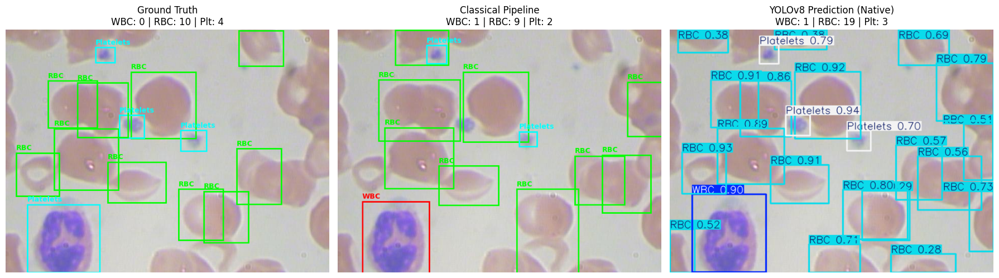


--- File: BloodImage_00327.jpeg ---


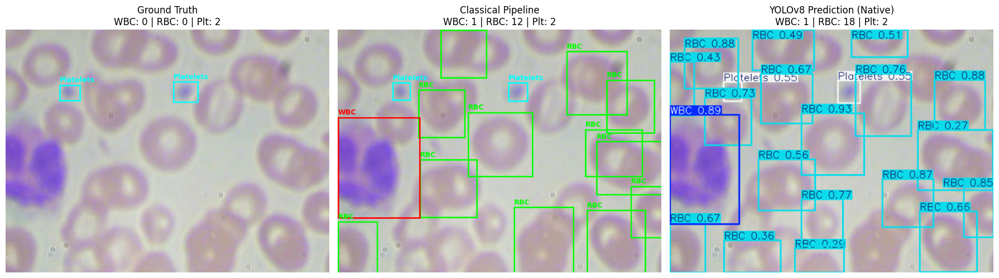


--- File: BloodImage_00178.jpeg ---


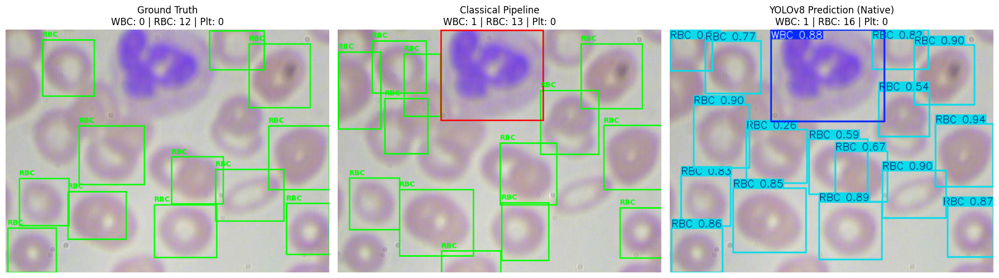


--- File: BloodImage_00171.jpeg ---


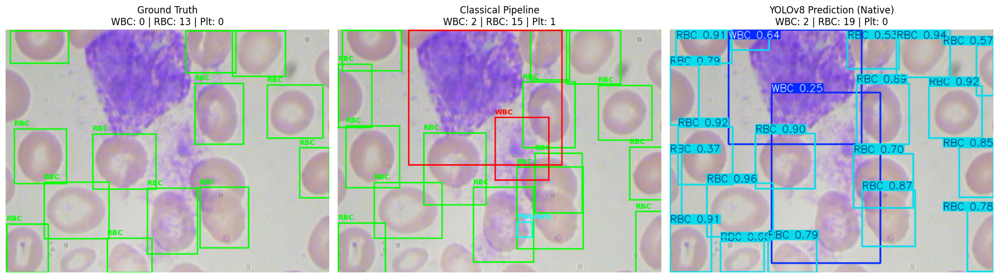

----------------------------------------------------------------------------------------------------
🔍 Viewing 4 samples for: EXCLUDED: Low RBC Samples (GT < 5)
   -> Found Clump (Area 12540). Estimated as 2 cells.

--- File: BloodImage_00157.jpeg ---


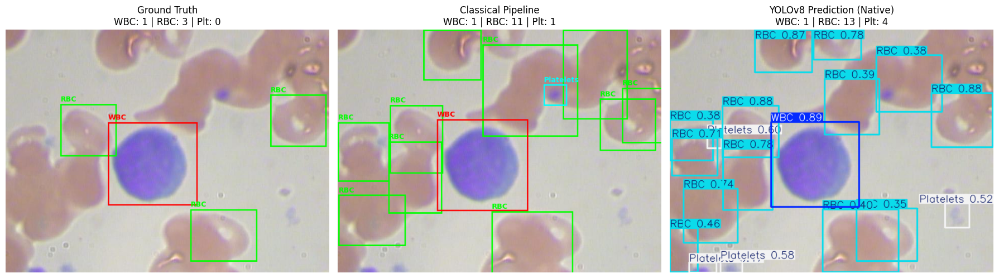


--- File: BloodImage_00327.jpeg ---


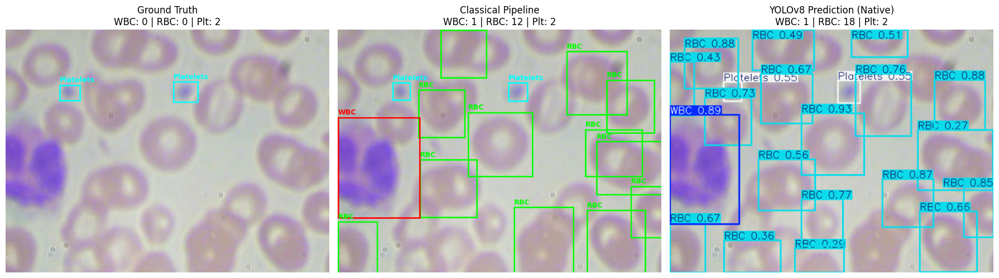


--- File: BloodImage_00249.jpeg ---


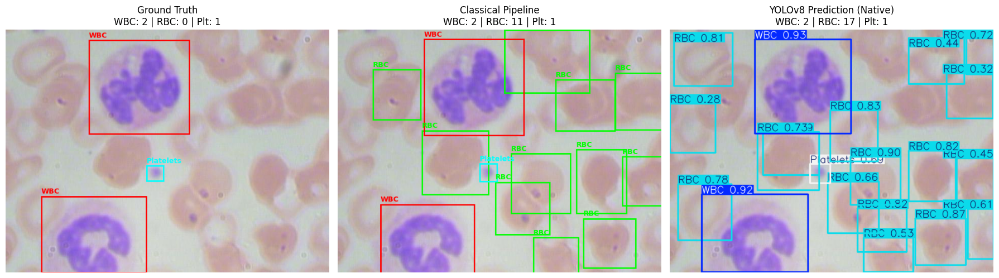


--- File: BloodImage_00303.jpeg ---


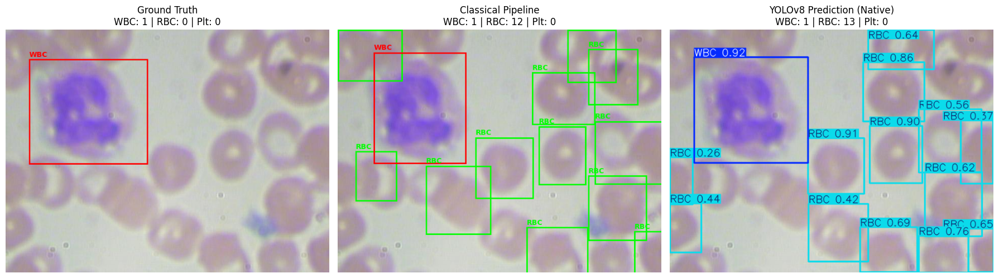

----------------------------------------------------------------------------------------------------
🔍 Viewing 3 samples for: DISAGREEMENT: Both Models detect 2 WBCs, but GT has 1
   -> Found Clump (Area 16279). Estimated as 3 cells.

--- File: BloodImage_00041.jpeg ---


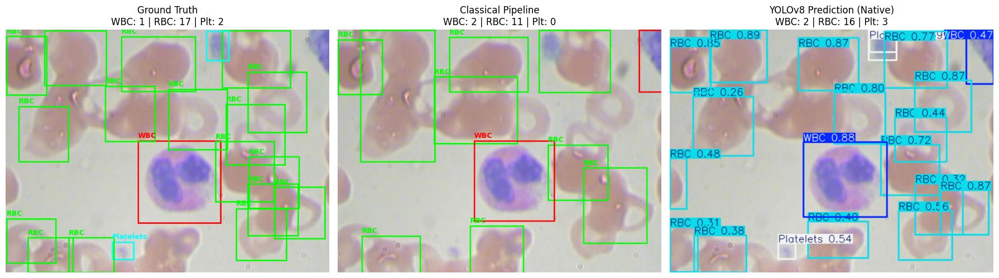


--- File: BloodImage_00290.jpeg ---


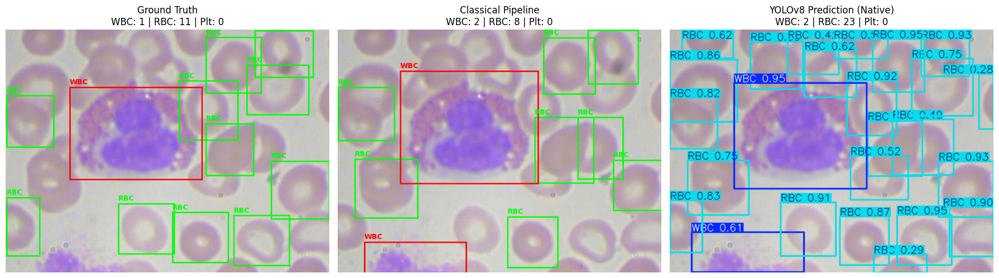


--- File: BloodImage_00103.jpeg ---


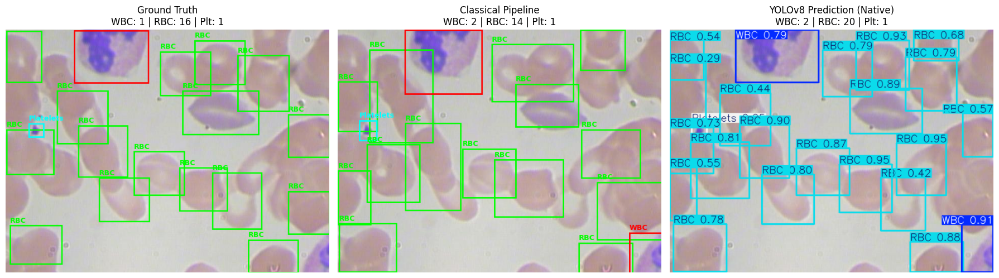

----------------------------------------------------------------------------------------------------


In [27]:
def visualize_excluded_and_mismatch(df_results, detector, model, limit):
    test_img_dir = DIRS['test']['img']

    def show_subset(df_subset, reason_title):
        if len(df_subset) == 0:
            print(f"✅ No samples found for: {reason_title}")
            return

        print(f"🔍 Viewing {min(limit, len(df_subset))} samples for: {reason_title}")
        
        count = 0
        for index, row in df_subset.iterrows():
            if count >= limit: break
            
            filename = row['Filename']
            
            img_path = os.path.join(test_img_dir, filename)
            
            try:
                original_img = get_image(img_path)
                
                gt_detections = []
                gt_wbc, gt_rbc, gt_plat = 0, 0, 0
                
                try:
                    ann_path = get_annotations_path(img_path)
                    ann_data = get_annotations(ann_path)
                    
                    # Calculate Counts
                    gt_wbc = sum(1 for obj in ann_data.get('objects', []) if obj['classTitle'] == 'WBC')
                    gt_rbc = sum(1 for obj in ann_data.get('objects', []) if obj['classTitle'] == 'RBC')
                    gt_plat = sum(1 for obj in ann_data.get('objects', []) if obj['classTitle'] == 'Platelets')
                    
                    for obj in ann_data.get('objects', []):
                        if obj['geometryType'] == 'rectangle':
                            p1, p2 = obj['points']['exterior']
                            gt_detections.append({
                                'classTitle': obj['classTitle'], 
                                'box': [p1[0], p1[1], p2[0] - p1[0], p2[1] - p1[1]]
                            })
                    gt_vis = visualize_detections(original_img, gt_detections)
                except Exception:
                    gt_vis = original_img.copy()

                # classical prediction
                class_detections = []
                c_wbc, c_rbc, c_plat = 0, 0, 0
                
                try:
                    res = detector.run_pipeline(original_img, visualize=False)
                    if res:
                        class_detections = res.get('detections', [])
                        c_wbc = res.get('wbc_count', 0)
                        c_rbc = res.get('rbc_count', 0)
                        c_plat = res.get('platelet_count', 0)
                    
                    class_vis = visualize_detections(original_img, class_detections)
                except Exception as e:
                    print(f"Classical Error: {e}")
                    class_vis = original_img.copy()

                # YOLO prediction
                y_wbc, y_rbc, y_plat = 0, 0, 0
                try:
                    results = model.predict(img_path, conf=0.25, verbose=False)
                    yolo_res = results[0]
                    
                    yolo_vis = yolo_res.plot() 
                    
                    if yolo_res.boxes:
                        cls_ids = yolo_res.boxes.cls.cpu().numpy()
                        y_wbc = np.sum(cls_ids == 0)
                        y_rbc = np.sum(cls_ids == 1)
                        y_plat = np.sum(cls_ids == 2)
                        
                except Exception as e:
                    print(f"YOLO Error: {e}")
                    yolo_vis = original_img.copy()

                print(f"\n--- File: {filename} ---")
                
                t_gt = f"Ground Truth\nWBC: {gt_wbc} | RBC: {gt_rbc} | Plt: {gt_plat}"
                t_cl = f"Classical Pipeline\nWBC: {c_wbc} | RBC: {c_rbc} | Plt: {c_plat}"
                t_yo = f"YOLOv8 Prediction (Native)\nWBC: {y_wbc} | RBC: {y_rbc} | Plt: {y_plat}"
                
                plot_data(
                    [gt_vis, class_vis, yolo_vis], 
                    titles=[t_gt, t_cl, t_yo]
                )
                count += 1
                
            except Exception as e:
                print(f"⚠️ General Error processing {filename}: {e}")
        
        print("-" * 100)
    
    # Zero WBC Samples
    df_no_wbc = df_results[df_results['GT_WBC'] < 1]
    show_subset(df_no_wbc, "EXCLUDED: Zero WBC Samples (GT < 1)")

    # Low RBC Samples
    df_low_rbc = df_results[df_results['GT_RBC'] < 5]
    show_subset(df_low_rbc, "EXCLUDED: Low RBC Samples (GT < 5)")

    # False Double Detection
    df_double_mistake = df_results[(df_results['Class_WBC'] == 2) & (df_results['YOLO_WBC'] == 2) & (df_results['GT_WBC'] == 1)]
    show_subset(df_double_mistake, "DISAGREEMENT: Both Models detect 2 WBCs, but GT has 1")

visualize_excluded_and_mismatch(df_final, detector, model, limit=4)

Looking at the images, it can be seen how the classical pipeline and YOLO tend to give the same answers (especially regarding WBCs and platelets, while the classical approach sometimes misses a few RBCs), but the anootations in the dataset are missing.

It's important to point out that we lack specific knowledge about histology and cytology, so some assumptions might result wrong from a rigorous biological point of view. Nevertheless, we think that it is reasonable to do so as this is just a project and not a real world application.

Lastly, given the systematic under-annotation observed in the original dataset, the standard evaluation metrics are inherently biased, often penalizing valid detections as false positives. Since we observed that the predictions and detections made by YOLO appeared to be the most precise, we adopted a refined benchmarking strategy: using the YOLOv8 predictions as the Ground Truth reference. This allows for a more rigorous technical comparison, effectively isolating the algorithmic performance of the Classical Pipeline from the noise introduced by the incomplete dataset.

🚀 Benchmarking Classical Pipeline against YOLO (as GT) on 72 images...
   -> Found Clump (Area 13120). Estimated as 2 cells.
   -> Found Clump (Area 13337). Estimated as 2 cells.
   -> Found Clump (Area 10969). Estimated as 2 cells.
   -> Found Clump (Area 16909). Estimated as 3 cells.
   -> Found Clump (Area 15838). Estimated as 3 cells.
   -> Found Clump (Area 13122). Estimated as 2 cells.
   -> Found Clump (Area 15500). Estimated as 3 cells.
   -> Found Clump (Area 11625). Estimated as 2 cells.
   -> Found Clump (Area 12540). Estimated as 2 cells.
   -> Found Clump (Area 13120). Estimated as 2 cells.
   -> Found Clump (Area 11092). Estimated as 2 cells.
   -> Found Clump (Area 11735). Estimated as 2 cells.
   -> Found Clump (Area 13906). Estimated as 2 cells.
   -> Found Clump (Area 13118). Estimated as 2 cells.
   -> Found Clump (Area 11615). Estimated as 2 cells.
   -> Found Clump (Area 11086). Estimated as 2 cells.
   -> Found Clump (Area 11323). Estimated as 2 cells.
   -> Found

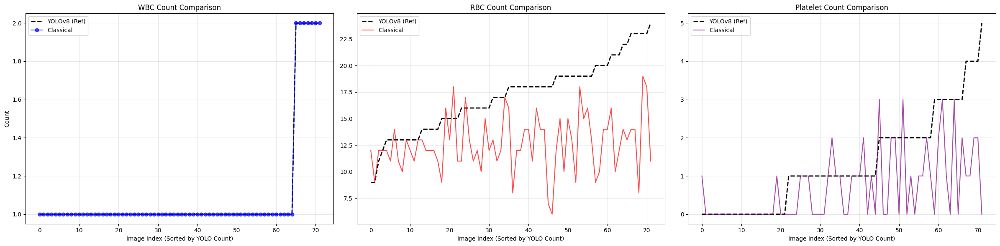

In [28]:
def benchmark_yolo_as_gt(detector, model, num_samples=100):
    test_img_dir = DIRS['test']['img']
    all_images = glob.glob(os.path.join(test_img_dir, '*.jpeg'))
    
    samples = random.sample(all_images, min(num_samples, len(all_images)))
    results = []
    
    print(f"🚀 Benchmarking Classical Pipeline against YOLO (as GT) on {len(samples)} images...")
    
    for img_path in samples:
        filename = os.path.basename(img_path)
        image = get_image(img_path)
        if image is None: continue
        
        # YOLO PREDICTIONS (The "New Ground Truth")
        yolo_wbc_boxes = []
        yolo_rbc_boxes = []
        yolo_plat_boxes = []
        
        try:
            yolo_res = model.predict(img_path, conf=0.25, verbose=False)[0]
            if yolo_res.boxes:
                for box in yolo_res.boxes:
                    coords = box.xyxy[0].cpu().numpy().tolist() # [x1, y1, x2, y2]
                    cls_id = int(box.cls[0])
                    
                    if cls_id == 0: yolo_wbc_boxes.append(coords)
                    elif cls_id == 1: yolo_rbc_boxes.append(coords)
                    elif cls_id == 2: yolo_plat_boxes.append(coords)
                    
        except Exception as e:
            print(f"YOLO Error on {filename}: {e}")
            continue

        y_wbc = len(yolo_wbc_boxes)
        y_rbc = len(yolo_rbc_boxes)
        y_plat = len(yolo_plat_boxes)

        # CLASSICAL PREDICTIONS
        class_wbc_boxes = []
        class_rbc_boxes = []
        class_plat_boxes = []
        
        try:
            res_class = detector.run_pipeline(image, visualize=False)
            
            if 'detections' in res_class:
                for d in res_class['detections']:
                    x, y, w, h = d['box']
                    box_fmt = [x, y, x+w, y+h] # Convert to [x1, y1, x2, y2]
                    
                    if d['classTitle'] == 'WBC': class_wbc_boxes.append(box_fmt)
                    elif d['classTitle'] == 'RBC': class_rbc_boxes.append(box_fmt)
                    elif d['classTitle'] == 'Platelets': class_plat_boxes.append(box_fmt)
                    
            c_wbc = res_class['wbc_count']
            c_rbc = res_class['rbc_count']
            c_plat = res_class['platelet_count']
            
        except Exception as e:
            print(f"Classical Error on {filename}: {e}")
            continue

        # COMPUTE METRICS
        
        # IoU: Classical boxes vs YOLO boxes
        iou_wbc = compute_image_iou(yolo_wbc_boxes, class_wbc_boxes)
        iou_rbc = compute_image_iou(yolo_rbc_boxes, class_rbc_boxes)
        iou_plat = compute_image_iou(yolo_plat_boxes, class_plat_boxes)
        
        results.append({
            'Filename': filename,
            # Counts
            'YOLO_WBC': y_wbc, 'Class_WBC': c_wbc,
            'YOLO_RBC': y_rbc, 'Class_RBC': c_rbc,
            'YOLO_Plt': y_plat, 'Class_Plt': c_plat,
            # Errors (Absolute Diff)
            'Err_WBC': abs(y_wbc - c_wbc),
            'Err_RBC': abs(y_rbc - c_rbc),
            'Err_Plt': abs(y_plat - c_plat),
            # Localization
            'IoU_WBC': iou_wbc,
            'IoU_RBC': iou_rbc,
            'IoU_Plt': iou_plat
        })
        
    df = pd.DataFrame(results)
    
    # PRINT SUMMARY & PLOT
    print("\n" + "="*60)
    print("CLASSICAL PIPELINE vs. YOLOv8 (Reference)")
    print("="*60)
    
    print("\n--- WHITE BLOOD CELLS (WBC) ---")
    print(f"Counting Error (MAE ± STD): {df['Err_WBC'].mean():.2f} ± {df['Err_WBC'].std():.2f}")
    print(f"Localization (Mean IoU)   : {df['IoU_WBC'].mean()*100:.1f}%")

    print("\n--- RED BLOOD CELLS (RBC) ---")
    print(f"Counting Error (MAE ± STD): {df['Err_RBC'].mean():.2f} ± {df['Err_RBC'].std():.2f}")
    print(f"Localization (Mean IoU)   : {df['IoU_RBC'].mean()*100:.1f}%")

    print("\n--- PLATELETS (Plt) ---")
    print(f"Counting Error (MAE ± STD): {df['Err_Plt'].mean():.2f} ± {df['Err_Plt'].std():.2f}")
    print(f"Localization (Mean IoU)   : {df['IoU_Plt'].mean()*100:.1f}%")
    print("="*60)

    # --- GRAPHS ---
    plt.figure(figsize=(24, 6))
    
    # WBC Plot
    plt.subplot(1, 3, 1)
    df_sorted = df.sort_values(by='YOLO_WBC').reset_index(drop=True)
    plt.plot(df_sorted['YOLO_WBC'], label='YOLOv8 (Ref)', color='black', linestyle='--', linewidth=2)
    plt.plot(df_sorted['Class_WBC'], label='Classical', color='blue', alpha=0.7, marker='o')
    plt.title("WBC Count Comparison")
    plt.xlabel("Image Index (Sorted by YOLO Count)")
    plt.ylabel("Count")
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # RBC Plot
    plt.subplot(1, 3, 2)
    df_sorted = df.sort_values(by='YOLO_RBC').reset_index(drop=True)
    plt.plot(df_sorted['YOLO_RBC'], label='YOLOv8 (Ref)', color='black', linestyle='--', linewidth=2)
    plt.plot(df_sorted['Class_RBC'], label='Classical', color='red', alpha=0.7)
    plt.title("RBC Count Comparison")
    plt.xlabel("Image Index (Sorted by YOLO Count)")
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Platelet Plot
    plt.subplot(1, 3, 3)
    df_sorted = df.sort_values(by='YOLO_Plt').reset_index(drop=True)
    plt.plot(df_sorted['YOLO_Plt'], label='YOLOv8 (Ref)', color='black', linestyle='--', linewidth=2)
    plt.plot(df_sorted['Class_Plt'], label='Classical', color='purple', alpha=0.7)
    plt.title("Platelet Count Comparison")
    plt.xlabel("Image Index (Sorted by YOLO Count)")
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    return df

df_yolo_comparison = benchmark_yolo_as_gt(detector, model, num_samples=100)

By establishing the fine-tuned YOLOv8 model as the reference standard (effectively treating its predictions as the Ground Truth), the performance of the Classical Pipeline can be evaluated without the interference of missing manual annotations. This comparison yields the following technical insights:

- **White Blood Cells (WBC)**: The pipeline demonstrates exceptional robustness, achieving a near-perfect counting match and high localization accuracy against the YOLO reference. This confirms that for distinct, high-contrast cells like WBCs, the HSV-based segmentation performs on par with the deep learning model.
- **Red Blood Cells (RBC)**: The Counting Error (MAE) shows a slight increase compared to the manual benchmark. This paradoxically validates the hypothesis regarding dataset incompleteness: the manual Ground Truth missed many cells, artificially lowering the error when the classical pipeline also missed them or under-segmented. When compared against YOLO (which detects the unlabelled cells), the error naturally rises, reflecting the true difficulty of segmenting dense cell clusters (rouleaux) with morphological operators compared to deep learning. The consistent but moderate localization score confirms that while the classical pipeline approximates the count well, it struggles to precisely delineate overlapping cell boundaries.
- **Platelets**: The degradation in both counting accuracy (higher MAE) and localization (lower IoU) against the YOLO reference exposes the classical pipeline's limited capacity to discriminate between platelets and background noise. Reliance on rigid geometric thresholds renders the morphological approach susceptible to artifacts, whereas the deep learning model successfully leverages learned features to filter out non-cellular elements.

# Conclusions

The comparative analysis between the Classical Image Processing pipeline and the Deep Learning model (YOLOv8) highlights the distinct advantages and limitations of each approach in the context of hematological analysis.

While the Classical Pipeline demonstrated impressive performance particularly in the detection and counting of White Blood Cells the Deep Learning approach proved to be the more robust solution for complex scenarios. By leveraging learned feature representations rather than rigid hand-crafted thresholds, the YOLO model successfully overcame the specific challenges that hindered the morphological algorithms, such as distinguishing platelets from background noise and accurately segmenting overlapping Red Blood Cells (rouleaux).

Nevertheless, the classical approach remains a highly valuable tool. Its deterministic nature offers complete interpretability, allowing for straightforward debugging and calibration based on known biological parameters (e.g., cell size or color). Furthermore, it is computationally lightweight and does not require extensive training data or hardware acceleration (GPUs), making it an ideal candidate for initial screening tools or low-resource environments where deploying a heavy neural network is not feasible.

### Lessons learned

Reflecting on the conclusion of this project, we are highly satisfied with the outcome. The final results not only met but exceeded our initial expectations, and the process of implementing the end-to-end pipeline made us better understand the concepts of image processing applied.

The most critical takeaway from this work is the fundamental importance of a comprehensive and accurate dataset. We quickly realized that the quality of the final output is strongly linked to the quality of the data available at the start. Because we lacked a reliable ground truth for comparison, quantifying our progress became a significant challenge.

Without a reliable benchmark for comparison, it was difficult to determine whether specific adjustments to the pipeline were actually improving our detection capabilities. For instance, we encountered several scenarios where an increase in the Mean Absolute Error (MAE) did not necessarily correlate with lower performance. To navigate this ambiguity, we had to adopt a more rigorous manual auditing process, i.e. frequently sampling and inspecting random sets of images to qualitatively verify the accuracy of our results. This experience underscored that while metrics are essential, they are only as useful as the data used to validate them.

# References

**Dataset**
The dataset used in this project is **BCCD (Blood Cell Count and Detection)**.
We thank the original authors for making this resource publicly available.

> Shenggan, Nicolas Chen, Cosmicad, and Akshaylamba.  
> *BCCD: Blood Cell Count and Detection*. (2018).  
> Available at: [https://github.com/Shenggan/BCCD_Dataset](https://github.com/Shenggan/BCCD_Dataset)
